### Import Libraries

In [143]:
import joblib
import sys
import nltk
import gensim
import time
import numpy as np
import pandas as pd
import seaborn as sns
import re
import pickle
# from helpers import *
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import SGDClassifier
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import StratifiedKFold 
from sklearn.metrics import log_loss
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import TruncatedSVD
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from scipy.sparse import coo_matrix, hstack, csr_matrix
from nltk.stem import WordNetLemmatizer
from sklearn.pipeline import Pipeline
from nltk.corpus import stopwords
from sklearn.decomposition import PCA
import lightgbm as lgb
from sklearn import metrics
import os
from matplotlib import pyplot as plt
from nltk.stem.porter import *
from googletrans import Translator
from joblib import parallel_backend # added line.
from ray.util.joblib import register_ray # added line.
#from tune_sklearn import TuneGridSearchCV
from scipy.stats import chisquare

from sklearn.experimental import enable_halving_search_cv  # noqa
from sklearn.model_selection import GridSearchCV,HalvingGridSearchCV
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import SGDClassifier
from sklearn.feature_selection import chi2
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif


from imblearn.under_sampling import NearMiss
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

from xgboost import XGBClassifier
from sklearn import svm
import nltk
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')
from nltk.stem import WordNetLemmatizer
#from nltk.tokenize import word_tokenize,pos_tag

from nltk import word_tokenize, pos_tag
nltk.download('averaged_perceptron_tagger')


print("Python Version : ", sys.version)
print("Joblib Version : ", joblib.__version__)

Python Version :  3.8.8 (default, Apr 13 2021, 15:08:03) [MSC v.1916 64 bit (AMD64)]
Joblib Version :  1.0.1


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ashis\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\ashis\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ashis\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\ashis\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


## Importing Ticket Details

In [144]:
dfTickets = pd.read_excel(r'D:\datascience\support_ticket_classification\incident_test.xlsx',engine='openpyxl')
dfTickets.head(50)

,Number,Priority,State,Assignment group,Assigned to,Description,Close code,Close notes,Opened,Resolved,...,Category,Impact,Urgency,Knowledge,Knowledge Base,Last reopened at,Made SLA,Reassignment count,Reopen count,Resolve time
0,INC0917534,4 - Low,Closed,PAN RCI INDIA CAB,NaN,Please route to IRF should be routed to the RC...,NaN,Closing as this will be handled by either prod...,2019-04-01 17:33:08,2019-07-16 16:10:23,...,Incident,4-Minor/Localized,3-Medium,False,NaN,NaT,True,1,0,9153435
1,INC0174710,3 - Moderate,Closed,PAN RCI NA NP CAB,NaN,EVR Account Page Layout Change Set needs to be...,Backed Out Change,Created an Incident insted of a change request...,2017-04-26 10:42:42,2017-04-26 12:27:15,...,Infrastructure,3-Moderate/Limited,3-Medium,False,NaN,NaT,False,0,0,6273
2,INC1219770,3 - Moderate,Closed,RCI Affiliate Reporting,NaN,Caller: Yamila Heavy\nContact Phone: (407) 597...,NaN,issue fixed,2020-01-12 15:22:10,2020-04-03 16:15:06,...,Request,3-Moderate/Limited,2-High,False,NaN,NaT,True,1,0,7084376
3,INC0410026,4 - Low,Closed,RCI Affiliate Reporting,NaN,"Greetings,\nExternal Portal users are getting ...",NaN,This Incident has been closed due to age and l...,2017-11-01 11:17:22,2019-07-16 14:30:35,...,Incident,4-Minor/Localized,3-Medium,False,NaN,NaT,True,1,0,53752393
4,INC1192111,4 - Low,Closed,RCI Affiliate Reporting,NaN,Caller: Remy Delacruz-RU249101\nContact Phone:...,NaN,issue fixed,2019-12-10 15:12:35,2020-04-03 15:58:31,...,Request,3-Moderate/Limited,4-Low,False,NaN,NaT,True,1,0,9935156
5,INC0118353,3 - Moderate,Closed,RCI Affiliate Reporting,NaN,User is not able to pull a report from reporti...,NaN,NaN,2017-03-09 13:03:31,2021-04-07 01:56:50,...,Software/Application,4-Minor/Localized,2-High,False,NaN,NaT,True,1,0,128692399
6,INC0067268,3 - Moderate,Closed,RCI Affiliate Reporting,NaN,(please respond to user RU053709 listed email ...,No Action Taken,This Incident has been closed due to age and l...,2017-01-12 03:35:44,2019-07-16 13:16:18,...,Incident,3-Moderate/Limited,3-Medium,False,NaN,NaT,True,4,0,79087234
7,INC0874576,4 - Low,Closed,RCI Affiliate Reporting,NaN,"ru260505\nMorino, Tomoko\nUser called in for a...",NaN,This Incident has been closed due to age and l...,2019-02-22 13:41:02,2019-07-16 14:49:04,...,Incident,3-Moderate/Limited,4-Low,False,NaN,NaT,True,0,0,12442082
8,INC1186600,4 - Low,Closed,RCI Affiliate Reporting,NaN,This e-mail is from an external source. Use c...,NaN,issue fixed,2019-12-04 16:35:37,2020-04-02 15:29:14,...,Incident,3-Moderate/Limited,4-Low,False,NaN,NaT,True,0,0,10360417
9,INC0874718,4 - Low,Closed,RCI Affiliate Reporting,NaN,Good morning\n\nPlease open a ticket for below...,NaN,This ticket was assigned to RCI reporting team...,2019-02-22 15:01:07,2019-03-13 14:18:12,...,Request,4-Minor/Localized,3-Medium,False,NaN,NaT,True,3,0,1635425


## Exploratory Data Analysis

In [145]:
dfTickets.shape

(192308, 26)

There are almost 2.3 lakhs of ticket data and 18 feature columns . 
We need to analyze each one the feature column to understand whether these columns are required for our modeling

In [146]:
dfTickets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 192308 entries, 0 to 192307
Data columns (total 26 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   Number              192308 non-null  object        
 1   Priority            192308 non-null  object        
 2   State               192308 non-null  object        
 3   Assignment group    192308 non-null  object        
 4   Assigned to         162678 non-null  object        
 5   Description         192203 non-null  object        
 6   Close code          147265 non-null  object        
 7   Close notes         176450 non-null  object        
 8   Opened              192308 non-null  datetime64[ns]
 9   Resolved            192308 non-null  datetime64[ns]
 10  Resolved by         192261 non-null  object        
 11  Severity            192308 non-null  object        
 12  Closed              192308 non-null  datetime64[ns]
 13  Closed by           175354 no

Lets understand each one of the feature column and decide whether its required to create our ML model.
Number :- Incident Number 
Priority :- Priority of the ticket 1 to 4 . 1 being more prioritized
State:- Status of the ticket
Assignment Group :- Group where it is assigned
Assigned To :- Person whom the ticket is being assigned in the group

#### Our target column will be 1. Assigned group and 2. Severity/Priority

In [147]:
dfTickets.isna().sum().to_frame() #Checking null values

,0
Number,0
Priority,0
State,0
Assignment group,0
Assigned to,29630
Description,105
Close code,45043
Close notes,15858
Opened,0
Resolved,0


Assign to , Close code , Closed and Closed by have null/zero values. However these columns will not be required to find the TARGET coulmn

#### Checking duplicate tickets by number

In [148]:
sum(dfTickets['Number'].value_counts()>1) 

0

There are no duplicate tickets 

#### Renaming feature group for easier understanding

In [149]:
dfTickets = dfTickets.rename(columns={'Assignment group': 'Assignmentgroup', 'Configuration item': 'ConfigurationItem'
                                     ,'Close code': 'Closecode','Knowledge Base': 'KnowledgeBase','Made SLA': 'MadeSLA','Reassignment count': 'Reassignmentcount'
                                     ,'Resolve time': 'Resolvetime'})

In [150]:
dfTickets = dfTickets.rename(columns={'Reopen count': 'Reopencount'})

In [151]:
dfTickets = dfTickets.rename(columns={'Assigned to': 'AssignedTo'})

In [152]:
dfTickets.head()

,Number,Priority,State,Assignmentgroup,AssignedTo,Description,Closecode,Close notes,Opened,Resolved,...,Category,Impact,Urgency,Knowledge,KnowledgeBase,Last reopened at,MadeSLA,Reassignmentcount,Reopencount,Resolvetime
0,INC0917534,4 - Low,Closed,PAN RCI INDIA CAB,NaN,Please route to IRF should be routed to the RC...,NaN,Closing as this will be handled by either prod...,2019-04-01 17:33:08,2019-07-16 16:10:23,...,Incident,4-Minor/Localized,3-Medium,False,NaN,NaT,True,1,0,9153435
1,INC0174710,3 - Moderate,Closed,PAN RCI NA NP CAB,NaN,EVR Account Page Layout Change Set needs to be...,Backed Out Change,Created an Incident insted of a change request...,2017-04-26 10:42:42,2017-04-26 12:27:15,...,Infrastructure,3-Moderate/Limited,3-Medium,False,NaN,NaT,False,0,0,6273
2,INC1219770,3 - Moderate,Closed,RCI Affiliate Reporting,NaN,Caller: Yamila Heavy\nContact Phone: (407) 597...,NaN,issue fixed,2020-01-12 15:22:10,2020-04-03 16:15:06,...,Request,3-Moderate/Limited,2-High,False,NaN,NaT,True,1,0,7084376
3,INC0410026,4 - Low,Closed,RCI Affiliate Reporting,NaN,"Greetings,\nExternal Portal users are getting ...",NaN,This Incident has been closed due to age and l...,2017-11-01 11:17:22,2019-07-16 14:30:35,...,Incident,4-Minor/Localized,3-Medium,False,NaN,NaT,True,1,0,53752393
4,INC1192111,4 - Low,Closed,RCI Affiliate Reporting,NaN,Caller: Remy Delacruz-RU249101\nContact Phone:...,NaN,issue fixed,2019-12-10 15:12:35,2020-04-03 15:58:31,...,Request,3-Moderate/Limited,4-Low,False,NaN,NaT,True,1,0,9935156


In [153]:
dfTickets.tail()

,Number,Priority,State,Assignmentgroup,AssignedTo,Description,Closecode,Close notes,Opened,Resolved,...,Category,Impact,Urgency,Knowledge,KnowledgeBase,Last reopened at,MadeSLA,Reassignmentcount,Reopencount,Resolvetime
192303,INC1527303,3 - Moderate,Closed,WVC Application L1 Support,Sabarinathan Somasundharm,"Agrawalla, Sulav\nMon 2/1/2021 10:53 PM\nHi Te...",Task Completed,Files has been pushed to respective PRODS,2021-02-02 13:14:20,2021-02-02 13:20:27,...,Incident,3-Moderate/Limited,3-Medium,False,NaN,NaT,True,0,0,367
192304,INC1332394,4 - Low,Closed,WVC Application L1 Support,Sabarinathan Somasundharm,Caller: Amy Whittaker\nContact Phone: (417) 53...,User Education,EMailed user about the steps hence closing . N...,2020-05-26 14:39:32,2020-05-27 14:31:23,...,Incident,3-Moderate/Limited,4-Low,False,NaN,NaT,True,2,0,85911
192305,INC1737827,4 - Low,Closed,WVC Application L1 Support,Sabarinathan Somasundharm,Kindly Delete an account for WVO CACS NA\n\nUs...,Account Disable,User account has been deleted for requested user,2021-10-04 14:11:08,2021-10-04 14:22:27,...,Request,4-Minor/Localized,3-Medium,False,NaN,NaT,True,0,0,679
192306,INC1606637,3 - Moderate,Closed,WVC Application L1 Support,Sabarinathan Somasundharm,Caller: Velicea Baugh-Gregg\nContact Phone: (4...,Restart Service,Updates are now showing in phone system. Hence...,2021-05-08 10:16:20,2021-05-08 11:58:08,...,Incident,2-Significant/Large,3-Medium,False,NaN,NaT,True,1,0,6108
192307,INC1413268,4 - Low,Closed,WVC Application L1 Support,Sabarinathan Somasundharm,Caller: Sharon Kitchen\nContact Phone: (407)...,User Education,sent instructions to user about the password s...,2020-09-01 13:50:09,2020-09-02 12:32:28,...,Incident,3-Moderate/Limited,4-Low,False,NaN,NaT,True,1,0,81739


#### EDA Univariate Analysis

#### Priority

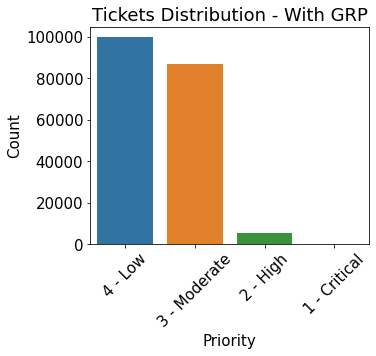

In [154]:
#Plot line graph and view counts of each tickets - After GRP

plt.subplots(figsize = (5,4))

sns.countplot(x='Priority', data=dfTickets,order = dfTickets['Priority'].value_counts().index)
plt.xlabel('Priority') 
plt.ylabel('Count') 
plt.xticks(rotation=45)
plt.title('Tickets Distribution - With GRP')
plt.show()

In [155]:
dfTickets['Priority'].value_counts().to_frame()

,Priority
4 - Low,99887
3 - Moderate,86761
2 - High,5363
1 - Critical,297


Observarions:

    There are total 4 types of priority. Low , moderate , high and critical where Low has the highest ticket count and critical has the lowest ticket count. It is clear that there is imbalance data set in this target column. We are considering assigning priority as one of the target column. we will rename this to Low as 4 , Moderate as 3, High as 2 and Critical as 1.

#### Assignment Group

In [156]:
dfTickets['Assignmentgroup'].value_counts().to_frame()

,Assignmentgroup
RCI LATAM Uruguay Help Desk,24265
WVC Application L1 Support,18525
RCI Desktop EME,13717
WVC DB Oracle Support,10419
RCI Weeks App Support,9275
RCI Job Failure,7706
RCI LATAM Mexico Service Desk,6795
RCI EME Service Desk,6119
RCI Call Center,5453
RCI EME Solutions Delivery,4752


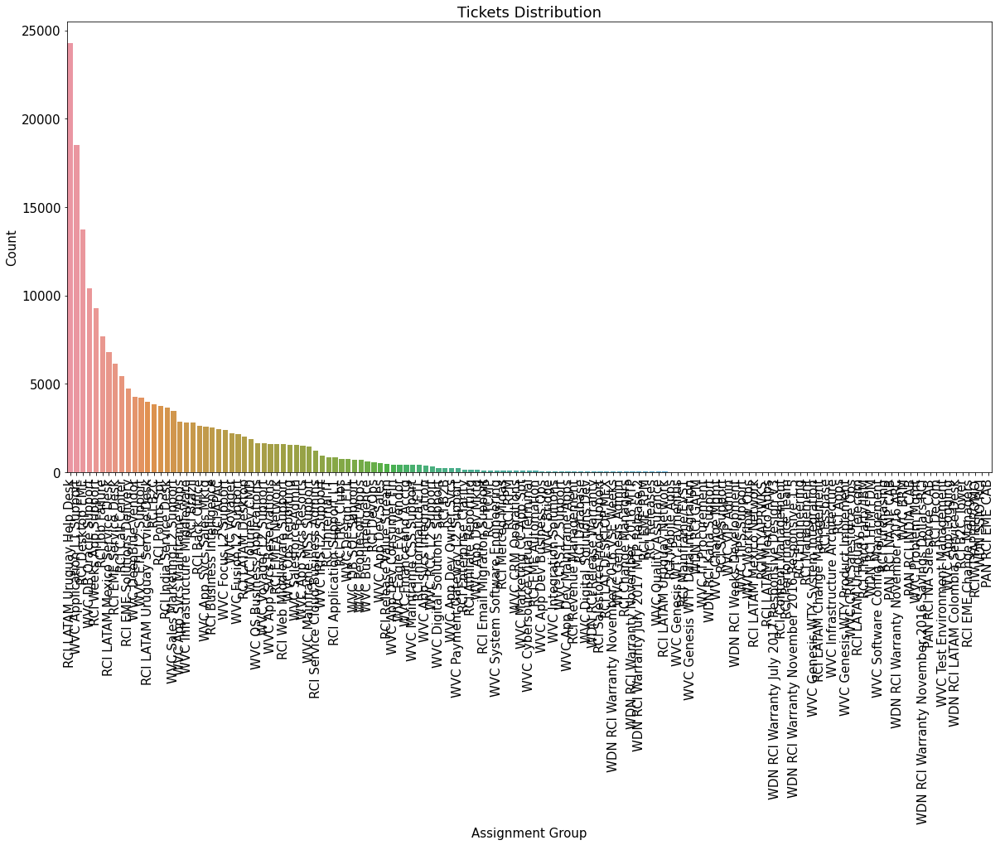

In [157]:
#Plot line graph and view counts of each tickets

plt.subplots(figsize = (20,10))

sns.countplot(x='Assignmentgroup', data=dfTickets,order = dfTickets['Assignmentgroup'].value_counts().index)
plt.xlabel('Assignment Group') 
plt.ylabel('Count') 
plt.xticks(rotation=90)
plt.title('Tickets Distribution')

plt.show()

Observartions:
    
    There is lot of imbalance in the data.
    WVC Application L1 Support group - has the highest number of tickets and RCI Decom has the lowest number of tickets.
    Groups which has lowest number of tickets needs to clustered into one group and require manual intervention later to 
    assign the tickets into right group.




#### Severity

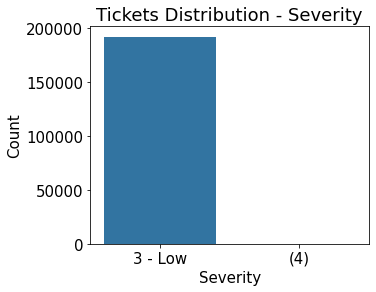

In [158]:
#Plot line graph and view counts of each tickets - After GRP

plt.subplots(figsize = (5,4))
sns.countplot(x='Severity', data=dfTickets,order = dfTickets['Severity'].value_counts().index)
plt.xlabel('Severity') 
plt.ylabel('Count') 
plt.title('Tickets Distribution - Severity')
plt.show()

In [159]:
dfTickets['Severity'].value_counts().to_frame()

,Severity
3 - Low,192046
(4),262


Observations:
    
    Severity - Low is the highest and seems all the tickets after resolution has been brought down to low. This feature column is a reduntant one and can be omitted out.

#### Category

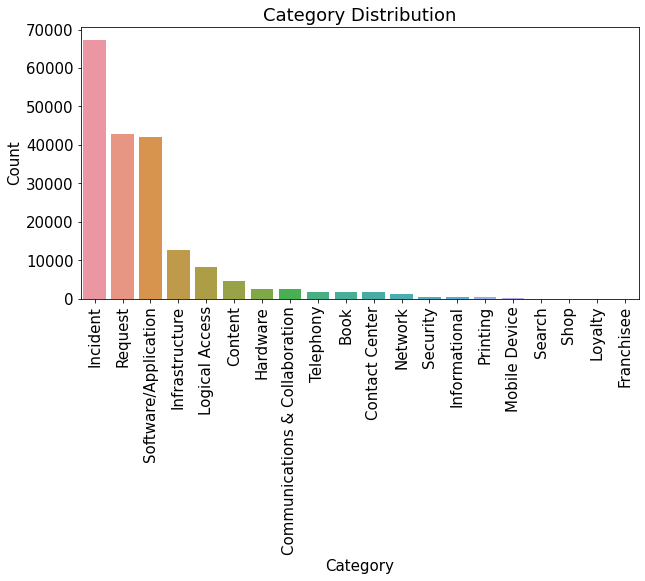

In [160]:
#Plot line graph and view counts of each tickets

plt.subplots(figsize = (10,5))
sns.countplot(x='Category', data=dfTickets,order = dfTickets['Category'].value_counts().index)
plt.xlabel('Category') 
plt.ylabel('Count') 
plt.xticks(rotation=90)
plt.title('Category Distribution')

plt.show()

In [161]:
dfTickets['Category'].value_counts().to_frame()

,Category
Incident,67260
Request,42754
Software/Application,42101
Infrastructure,12685
Logical Access,8176
Content,4703
Hardware,2707
Communications & Collaboration,2540
Telephony,1924
Book,1822


Observations:
    
    Highly imbalanced data set.Incident has the highest categorization followed by Software applications and request.Franchisee has the lowest. This can be consider as another target variable which can derived from description. 

#### EDA Bivariate Analysis

#### Number of priority ticket per category

<AxesSubplot:title={'center':'Number of priorities per category'}, ylabel='Category'>

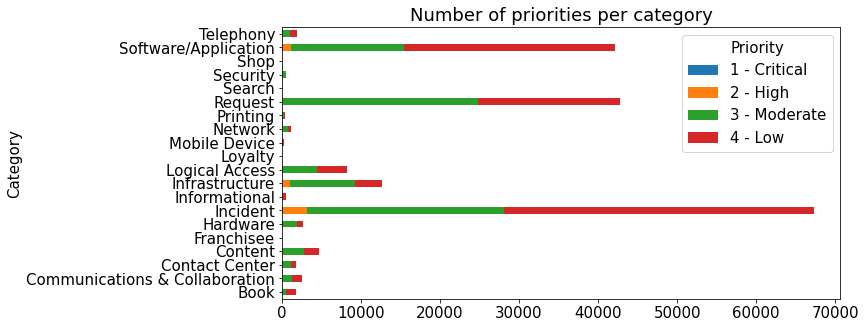

In [162]:
dfTickets.groupby(['Category', 'Priority']).size().unstack().plot(kind='barh', stacked=True, title="Number of priorities per category",figsize = (10,5))

Observatons:
    
    Shop and Francise category almost have zero tickets
    Security category has tickets tagged as moderate
    Most of the categories have tickets with low to be more than other priorities
    Critical tickets are very few suggesting stability of the applications

In [163]:
dfTickets.groupby(['Assignmentgroup','Priority']).size().unstack()

Priority,1 - Critical,2 - High,3 - Moderate,4 - Low
Assignmentgroup,,,,
PAN RCI EME CAB,NaN,NaN,1.0,NaN
PAN RCI INDIA CAB,NaN,NaN,NaN,2.0
PAN RCI NA NP CAB,NaN,NaN,1.0,1.0
PAN RCI NA Salesforce CAB,NaN,NaN,1.0,NaN
RCI APAC,10.0,12.0,442.0,1963.0
RCI Affiliate Reporting,NaN,NaN,36.0,91.0
RCI Application Support L1,NaN,NaN,13.0,847.0
RCI Apps,NaN,NaN,2.0,1.0
RCI B2B,2.0,11.0,47.0,179.0


In [164]:
# figure and axis
dfTickets.groupby(['Assignmentgroup','Priority']).size().unstack().plot(kind='barh', stacked=True,figsize = (200,200),width=1.0,fontsize=90)
plt.rcParams.update({'font.size': 15})
plt.show()

Final Observation from EDA:
    
    Target groups : Assignement group,Priority,Category.
    For each target group we have highly imbalance data.
    Severity feature can be removed as it will have no impact 
    235013 incident
    18 feature
    No duplicate tickets 
    Critical ticket are very less proving system stability
    Incident is highest category with 85660 number of tickets assigned
    WVC Application L1 Support is the largest Assignment group with 28511 tickets
    Priority 4 are the highest number of tickets

#### Data Wrangling

#### Null or Empty value checking

In [165]:
dfTickets.isna().sum().to_frame() #Checking null values

,0
Number,0
Priority,0
State,0
Assignmentgroup,0
AssignedTo,29630
Description,105
Closecode,45043
Close notes,15858
Opened,0
Resolved,0


We have null values in description, configuration items and category.

In [166]:
# Copying it into new dataframe
df_Tickets_new = dfTickets.copy()   

In [167]:
df_Tickets_new.shape

(192308, 26)

In [168]:
#Removed any rows where we have null or empty values for Description feature
#df_Tickets_new.dropna(subset = ['Description'], inplace = True) 
#df_Tickets_new.isna().sum().to_frame() #Checking null values

Removed any rows where we have null or empty values for Description feature

In [169]:
df_Tickets_new.isna().sum().to_frame() #Checking null values

,0
Number,0
Priority,0
State,0
Assignmentgroup,0
AssignedTo,29630
Description,105
Closecode,45043
Close notes,15858
Opened,0
Resolved,0


#### Reviewing Assignment group

Assignment group will be our target group . The ML model needs to derive insight from the description feature and 
define which group it will be assigned.

In [170]:
pd.set_option('display.max_rows', None)

Lets view all the groups with ticket assigned more than 200 . We will see what is the lowest group of tickets which can help the model to learn well.Rest we will put into one single class/label as with small number of tickets it will be hard for the model to learn. 

#### State 

D:\softwares\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


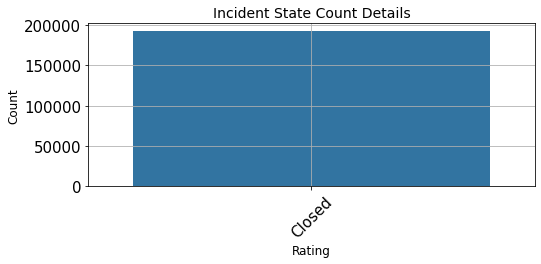

In [171]:
# Incident State
fig_dims = (8,3)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(df_Tickets_new['State'],ax=ax)
plt.title("Incident State Count Details", size = 14)
plt.xlabel("Rating", size=12)
plt.ylabel("Count", size=12)
plt.xticks(rotation=45)
plt.grid()
plt.show()

Objervation 
    
    1.We have chosen the closed tickets only

#### Retreiving days of the week

In [172]:
# Day of the week column, month and day
df_Tickets_new['day_of_week'] = df_Tickets_new['Opened'].dt.day_name()
df_Tickets_new['month'] = df_Tickets_new['Opened'].dt.month
df_Tickets_new['day'] = df_Tickets_new['Opened'].dt.day
df_Tickets_new['hour'] = df_Tickets_new['Opened'].dt.hour

In [173]:
df_Tickets_new.head()

,Number,Priority,State,Assignmentgroup,AssignedTo,Description,Closecode,Close notes,Opened,Resolved,...,KnowledgeBase,Last reopened at,MadeSLA,Reassignmentcount,Reopencount,Resolvetime,day_of_week,month,day,hour
0,INC0917534,4 - Low,Closed,PAN RCI INDIA CAB,NaN,Please route to IRF should be routed to the RC...,NaN,Closing as this will be handled by either prod...,2019-04-01 17:33:08,2019-07-16 16:10:23,...,NaN,NaT,True,1,0,9153435,Monday,4,1,17
1,INC0174710,3 - Moderate,Closed,PAN RCI NA NP CAB,NaN,EVR Account Page Layout Change Set needs to be...,Backed Out Change,Created an Incident insted of a change request...,2017-04-26 10:42:42,2017-04-26 12:27:15,...,NaN,NaT,False,0,0,6273,Wednesday,4,26,10
2,INC1219770,3 - Moderate,Closed,RCI Affiliate Reporting,NaN,Caller: Yamila Heavy\nContact Phone: (407) 597...,NaN,issue fixed,2020-01-12 15:22:10,2020-04-03 16:15:06,...,NaN,NaT,True,1,0,7084376,Sunday,1,12,15
3,INC0410026,4 - Low,Closed,RCI Affiliate Reporting,NaN,"Greetings,\nExternal Portal users are getting ...",NaN,This Incident has been closed due to age and l...,2017-11-01 11:17:22,2019-07-16 14:30:35,...,NaN,NaT,True,1,0,53752393,Wednesday,11,1,11
4,INC1192111,4 - Low,Closed,RCI Affiliate Reporting,NaN,Caller: Remy Delacruz-RU249101\nContact Phone:...,NaN,issue fixed,2019-12-10 15:12:35,2020-04-03 15:58:31,...,NaN,NaT,True,1,0,9935156,Tuesday,12,10,15


D:\softwares\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


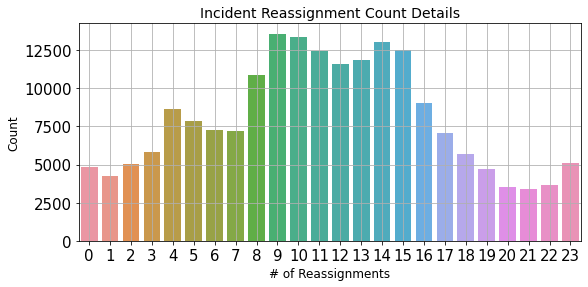

In [174]:
# reassignment_count
fig_dims = (9, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(df_Tickets_new['hour'],ax=ax)
plt.title("Incident Reassignment Count Details", size = 14)
plt.xlabel("# of Reassignments", size=12)
plt.ylabel("Count", size=12)
plt.grid()
plt.show()

#### Reassignemnt of the ticket

D:\softwares\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


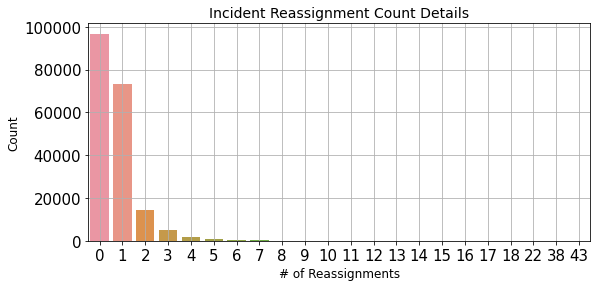

In [175]:
# reassignment_count
fig_dims = (9, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(df_Tickets_new['Reassignmentcount'],ax=ax)
plt.title("Incident Reassignment Count Details", size = 14)
plt.xlabel("# of Reassignments", size=12)
plt.ylabel("Count", size=12)
plt.grid()
plt.show()

Observation 

    1. More than 60000 tickets has been reassigned at least once which may influence on the resolution time of the ticket  

#### Reopenning of the ticket

D:\softwares\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


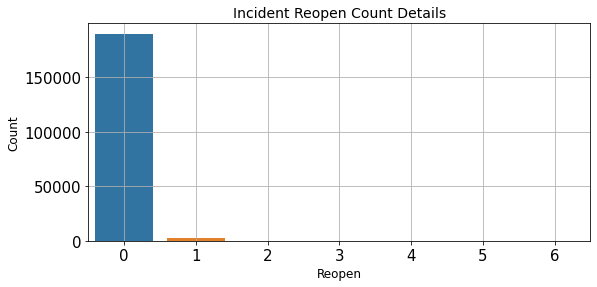

In [176]:
# 'reopen_count'
fig_dims = (9, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(df_Tickets_new['Reopencount'],ax=ax)
plt.title("Incident Reopen Count Details", size = 14)
plt.xlabel("Reopen", size=12)
plt.ylabel("Count", size=12)
plt.grid()
plt.show()

Observation 

        1. There is very few tickets which has been reopened as For the most of the tickets has not been opened after the initial closure

D:\softwares\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


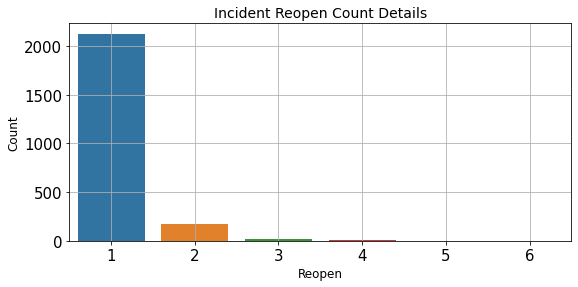

In [177]:
# 'reopen_count'
# Lets try to visualize the data without the '0'
fig_dims = (9, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(df_Tickets_new[df_Tickets_new.Reopencount!=0]['Reopencount'],ax=ax)
plt.title("Incident Reopen Count Details", size = 14)
plt.xlabel("Reopen", size=12)
plt.ylabel("Count", size=12)
plt.grid()
plt.show()

Observation 

    1. Almost 2000 tickets has been reopened 
    2. Almost 250 times the tickets has been reopened
    3. Almost 50 times the tickets has been reopened

#### SLA

In [178]:
# made_sla
# Out of 20769 Incidents, 8174 Incidents have the SLA breached
print("Number of Incidents with SLA Breached", len(df_Tickets_new[df_Tickets_new.MadeSLA==False]['Number'].unique()))
print(f"Percentage of Incidents with SLA Breached {len(df_Tickets_new[df_Tickets_new.MadeSLA==False]['Number'].unique())/len(df_Tickets_new.Number.unique())*100} %")

Number of Incidents with SLA Breached 6746
Percentage of Incidents with SLA Breached 3.50791438733698 %


For any service Provider, this would be a grave concern.
Hence we need a model that can predict how long would a Incident would need to get resolved
With this data, we can focus on the Incidents which take longer time and take necessary steps to mitigate it, so that the company does not end up paying penalty.

#### Ticket opened 

In [179]:
df_Tickets_new.Opened = pd.to_datetime(df_Tickets_new.Opened)

In [180]:
df_Tickets_new.Opened

0        2019-04-01 17:33:08
1        2017-04-26 10:42:42
2        2020-01-12 15:22:10
3        2017-11-01 11:17:22
4        2019-12-10 15:12:35
5        2017-03-09 13:03:31
6        2017-01-12 03:35:44
7        2019-02-22 13:41:02
8        2019-12-04 16:35:37
9        2019-02-22 15:01:07
10       2020-01-25 18:47:44
11       2018-01-30 17:23:28
12       2017-03-24 10:00:41
13       2019-05-23 22:12:04
14       2019-12-06 09:46:25
15       2016-12-22 10:11:16
16       2017-01-04 04:25:36
17       2019-10-22 16:06:43
18       2016-12-31 00:38:49
19       2016-12-23 00:04:53
20       2017-12-13 10:37:01
21       2020-06-29 11:15:17
22       2017-10-10 10:35:52
23       2020-08-24 12:31:19
24       2017-05-10 10:33:12
25       2016-12-28 15:10:38
26       2017-01-11 08:12:35
27       2018-11-19 14:36:38
28       2016-12-15 16:41:46
29       2016-12-20 09:11:08
30       2019-12-05 19:12:39
31       2016-12-10 12:39:57
32       2019-03-11 16:43:20
33       2017-02-08 00:28:36
34       2019-

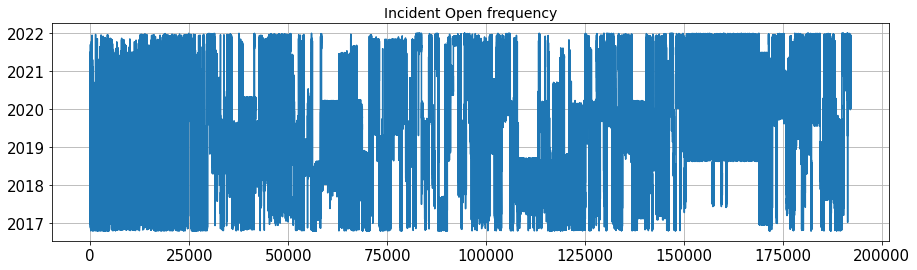

In [181]:
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
plt.plot(df_Tickets_new['Opened'])
plt.title("Incident Open frequency", size = 14)
#plt.xlabel("Reopen", size=12)
#plt.ylabel("Count", size=12)
plt.grid()
plt.show()

#### Category

D:\softwares\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


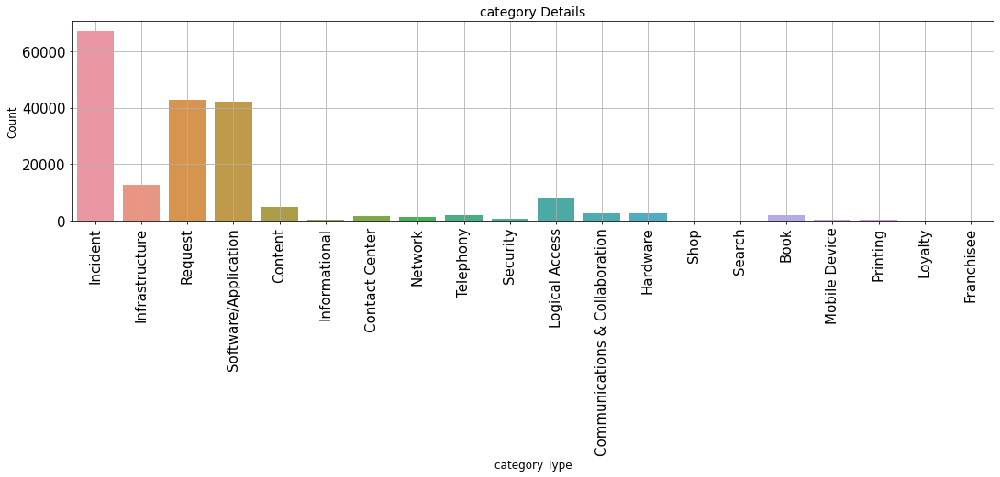

In [182]:
# 'category'
fig_dims = (18, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(df_Tickets_new['Category'],ax=ax)
plt.title("category Details", size = 14)
plt.xlabel("category Type", size=12)
plt.ylabel("Count", size=12)
plt.xticks(rotation=90)
plt.grid()
plt.show()

#### Impact

D:\softwares\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


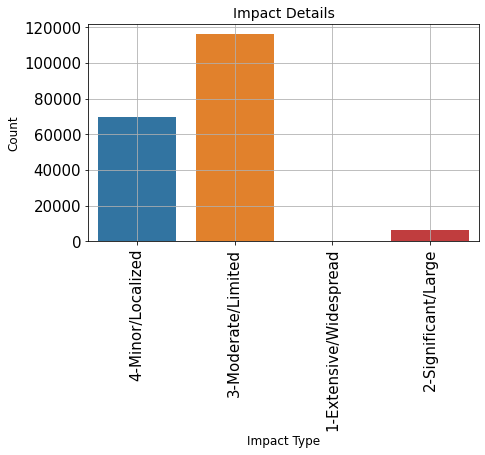

3-Moderate/Limited        116094
4-Minor/Localized          69644
2-Significant/Large         6122
1-Extensive/Widespread       446
Name: Impact, dtype: int64

In [183]:
# 'impact' - This a very important field as based on this a service company calculates profit or penalty
# This plays a major role in our Incident resolution time as well
fig_dims = (7, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(df_Tickets_new['Impact'],ax=ax)
plt.title("Impact Details", size = 14)
plt.xlabel("Impact Type", size=12)
plt.ylabel("Count", size=12)
plt.xticks(rotation=90)
plt.grid()
plt.show()
df_Tickets_new['Impact'].value_counts()

This a very important field as based on this a service company calculates profit or penalty.
This plays a major role in our Incident resolution time as well.

Observations:

    1. Approx. 446 tickets have major impact on the business . Require faster resolution time
    2. Approx. 6122 tickets have moderate impact on the business

#### Urgency

D:\softwares\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


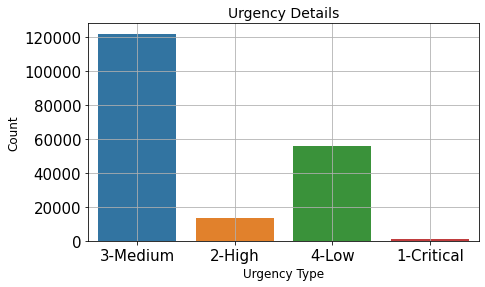

3-Medium      122178
4-Low          56058
2-High         13202
1-Critical       870
Name: Urgency, dtype: int64

In [184]:
# 'urgency' - This a very important field as based which the ticket is being handled
# This plays a major role in our Incident resolution time as well
fig_dims = (7, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(df_Tickets_new['Urgency'],ax=ax)
plt.title("Urgency Details", size = 14)
plt.xlabel("Urgency Type", size=12)
plt.ylabel("Count", size=12)
#plt.xticks(rotation=90)
plt.grid()
plt.show()
df_Tickets_new['Urgency'].value_counts()

This a very important field as based which the ticket is being handled
This plays a major role in our Incident resolution time as well

Observations:

    1. Approx. 870 tickets will require urgent fix
    2. Approx. 13202 require high speed fix

#### Priority

D:\softwares\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


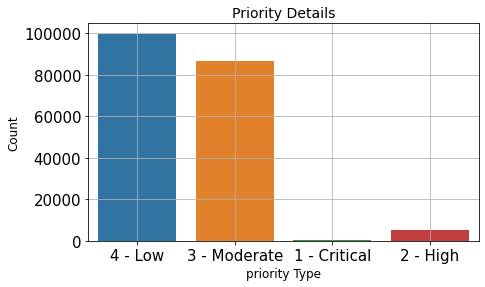

4 - Low         99887
3 - Moderate    86761
2 - High         5363
1 - Critical      297
Name: Priority, dtype: int64

In [185]:
# ''priority' - Combination of both Impact and urgency
# This plays a major role in our Incident resolution time as well
fig_dims = (7, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(df_Tickets_new['Priority'],ax=ax)
plt.title("Priority Details", size = 14)
plt.xlabel("priority Type", size=12)
plt.ylabel("Count", size=12)
#plt.xticks(rotation=90)
plt.grid()
plt.show()
df_Tickets_new['Priority'].value_counts()

#### Assigned TO

In [186]:
df_Tickets_new['AssignedTo'].value_counts()

OSCAR JAVIER ALCALDE DE BIAGGI       18523
DEIVDY SILVA SANTOS                   6967
Gregg Humerickhouse                   5862
Arnab Pal                             5372
Jade Reece                            5050
Corky Aiken                           4366
Kay Austin                            3405
Marlon White                          3172
Cristina Garcia Mongil                2959
Antonio Fabio Vieira Gomes            2801
Muniraja Papanna                      2690
Mark Coleman                          2433
Oscar Omar Sanchez Robles             2328
Ramya Raman                           2189
Christopher Beveridge                 2050
Jay Tall                              1986
Devraj Das                            1965
Anirban Saha                          1811
Eshwar KM                             1789
Darren Carroll                        1721
Pinaki Kantha                         1689
Ronald Bulger                         1678
Jim O'Mahony                          1653
Pritam Chau

AssignedTO can play a very important role in understanding the resolution time of a ticket . More experience resource will solve the ticket at a faster rate.

# Incident closure details
fig_dims = (14, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(df_Tickets_new['Closecode'],ax=ax)
plt.title("Closed code Details", size = 14)
plt.xlabel("Closed code Type", size=12)
plt.ylabel("Count", size=12)
plt.xticks(rotation=90)
plt.grid()
plt.show()
df_Tickets_new['Closecode'].value_counts()

#### Resolved BY

In [187]:
df_Tickets_new['Resolved by'].value_counts()

OSCAR JAVIER ALCALDE DE BIAGGI           20224
Gregg Humerickhouse                       6336
Arnab Pal                                 5520
Marlon White                              5323
Jade Reece                                5133
DEIVDY SILVA SANTOS                       4831
Corky Aiken                               4207
Kay Austin                                3371
Cristina Garcia Mongil                    2938
Antonio Fabio Vieira Gomes                2802
Muniraja Papanna                          2605
Oscar Omar Sanchez Robles                 2553
Saurabh Kumar Singh                       2473
Mark Coleman                              2415
Christopher Beveridge                     2278
Kerri Brinson                             2144
Ramya Raman                               2119
Jay Tall                                  2093
Scott Burfeind                            1962
Mercy Guadalupe Xuluc Martin              1918
Devraj Das                                1901
Pritam Chaudh

Resolved by can play a very important role in understanding the resolution time of a ticket . More experience resource will solve the ticket at a faster rate.

In [188]:
df_Tickets_new['Resolved']=pd.to_datetime(df_Tickets_new['Resolved'])

#### Knowledge Base

D:\softwares\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


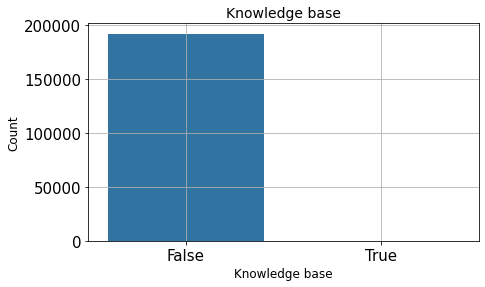

False    192081
True        227
Name: Knowledge, dtype: int64

In [189]:
# ''Knowledge' - Tickets fixed on knowledge based
# This plays a major role in our Incident resolution time as well
fig_dims = (7, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(df_Tickets_new['Knowledge'],ax=ax)
plt.title("Knowledge base", size = 14)
plt.xlabel("Knowledge base", size=12)
plt.ylabel("Count", size=12)
#plt.xticks(rotation=90)
plt.grid()
plt.show()
df_Tickets_new['Knowledge'].value_counts()

Very few tickets are opened based on knowledge base

#### Configuration Item

D:\softwares\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


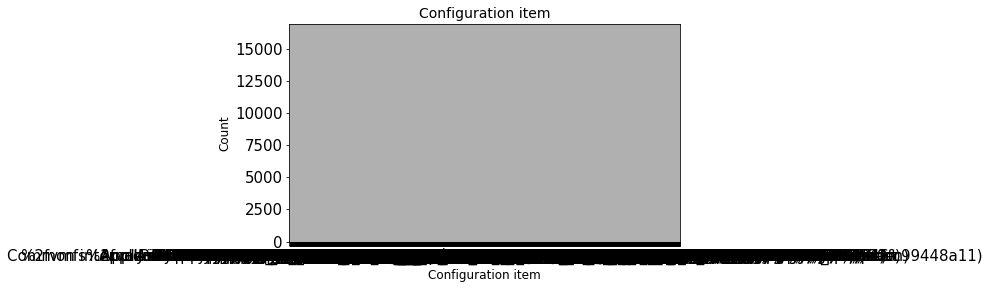

Service Desk Support                                                                    16099
EVS1                                                                                    12778
INFORMATICA - PC                                                                         7647
Guide Portal                                                                             4402
FOCUS                                                                                    4348
Weeks - Exchange                                                                         4293
TRIP                                                                                     3927
SAS                                                                                      3704
TELECOM-216-7.RCI.COM                                                                    3675
Salesforce                                                                               3573
Salepoint                                                   

In [190]:
# ''Configuration Item' - Configuration Item
# This plays a major role in our Config Item resolution time as well
fig_dims = (7, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(df_Tickets_new['ConfigurationItem'],ax=ax)
plt.title("Configuration item", size = 14)
plt.xlabel("Configuration item", size=12)
plt.ylabel("Count", size=12)
#plt.xticks(rotation=90)
plt.grid()
plt.show()
df_Tickets_new['ConfigurationItem'].value_counts()

#### Creating Target Variable

In [191]:
df_Tickets_new['Opened']=pd.to_datetime(df_Tickets_new['Opened'])
df_Tickets_new['Resolved']=pd.to_datetime(df_Tickets_new['Resolved'])
df_Tickets_new['Difference'] = (df_Tickets_new['Resolved'] - df_Tickets_new['Opened']).dt.days
df_Tickets_new['ActualTime'] = np.array(df_Tickets_new['Difference'])

In [192]:
df_Tickets_new['ActualTime'] = np.abs(df_Tickets_new['ActualTime'])

In [193]:
df_Tickets_new['ActualTime'] = df_Tickets_new['ActualTime'].apply(lambda x: x if x>0 else x+1)

In [194]:
df_Tickets_new.head()

,Number,Priority,State,Assignmentgroup,AssignedTo,Description,Closecode,Close notes,Opened,Resolved,...,MadeSLA,Reassignmentcount,Reopencount,Resolvetime,day_of_week,month,day,hour,Difference,ActualTime
0,INC0917534,4 - Low,Closed,PAN RCI INDIA CAB,NaN,Please route to IRF should be routed to the RC...,NaN,Closing as this will be handled by either prod...,2019-04-01 17:33:08,2019-07-16 16:10:23,...,True,1,0,9153435,Monday,4,1,17,105,105
1,INC0174710,3 - Moderate,Closed,PAN RCI NA NP CAB,NaN,EVR Account Page Layout Change Set needs to be...,Backed Out Change,Created an Incident insted of a change request...,2017-04-26 10:42:42,2017-04-26 12:27:15,...,False,0,0,6273,Wednesday,4,26,10,0,1
2,INC1219770,3 - Moderate,Closed,RCI Affiliate Reporting,NaN,Caller: Yamila Heavy\nContact Phone: (407) 597...,NaN,issue fixed,2020-01-12 15:22:10,2020-04-03 16:15:06,...,True,1,0,7084376,Sunday,1,12,15,82,82
3,INC0410026,4 - Low,Closed,RCI Affiliate Reporting,NaN,"Greetings,\nExternal Portal users are getting ...",NaN,This Incident has been closed due to age and l...,2017-11-01 11:17:22,2019-07-16 14:30:35,...,True,1,0,53752393,Wednesday,11,1,11,622,622
4,INC1192111,4 - Low,Closed,RCI Affiliate Reporting,NaN,Caller: Remy Delacruz-RU249101\nContact Phone:...,NaN,issue fixed,2019-12-10 15:12:35,2020-04-03 15:58:31,...,True,1,0,9935156,Tuesday,12,10,15,115,115


In [195]:
np.sort(df_Tickets_new['ActualTime'].unique())

array([   1,    2,    3,    4,    5,    6,    7,    8,    9,   10,   11,
         12,   13,   14,   15,   16,   17,   18,   19,   20,   21,   22,
         23,   24,   25,   26,   27,   28,   29,   30,   31,   32,   33,
         34,   35,   36,   37,   38,   39,   40,   41,   42,   43,   44,
         45,   46,   47,   48,   49,   50,   51,   52,   53,   54,   55,
         56,   57,   58,   59,   60,   61,   62,   63,   64,   65,   66,
         67,   68,   69,   70,   71,   72,   73,   74,   75,   76,   77,
         78,   79,   80,   81,   82,   83,   84,   85,   86,   87,   88,
         89,   90,   91,   92,   93,   94,   95,   96,   97,   98,   99,
        100,  101,  102,  103,  104,  105,  106,  107,  108,  109,  110,
        111,  112,  113,  114,  115,  116,  117,  118,  119,  120,  121,
        122,  123,  124,  125,  126,  127,  128,  129,  130,  131,  132,
        133,  134,  135,  136,  137,  138,  139,  140,  141,  142,  143,
        144,  145,  146,  147,  148,  149,  150,  1

In [196]:
df_Tickets_new['ActualTime'].value_counts().to_frame()

,ActualTime
1,106072
2,10918
3,7995
4,6040
5,4996
6,4405
7,3623
8,2634
9,2130
10,2067


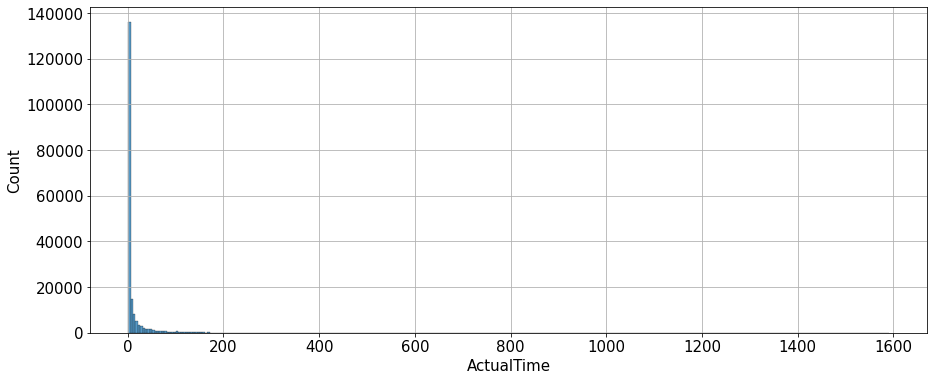

In [197]:
# Lets see the distribution of this dependent variable that we have created
fig_dims = (15, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sns.histplot((df_Tickets_new['ActualTime']),binwidth=5)
plt.grid()
plt.show()

In Support Industry, it is highly irregular for an Incident to take up more than 5-10 days to resolve any Incident
Usually the SLA clock runs only during the business hours which is 8 hrs.
Hence as lets try to see the distribution by dividing the value by 8 hrs.
But the open and closed date only takes the date & time at that specific instance.

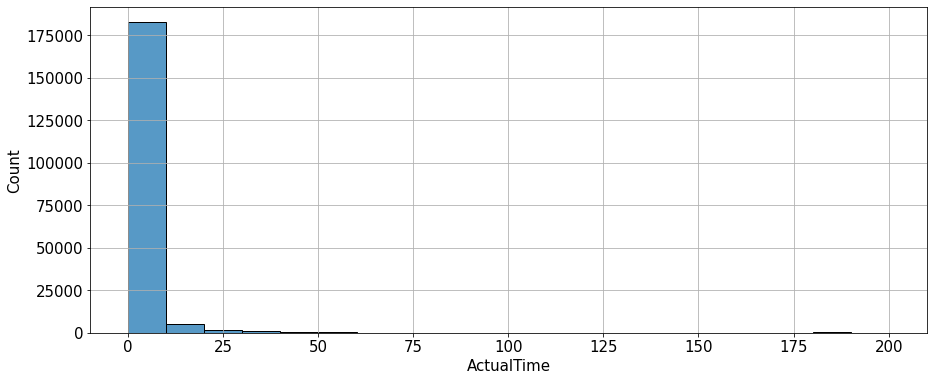

In [198]:
# Lets see the distribution of this dependent variable that we have created
fig_dims = (15, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sns.histplot(np.abs((df_Tickets_new['ActualTime'])/8),binwidth=10)
plt.grid()
plt.show()

Seeing the distribution we can say that the Industry standard SLA are not maintained here.

In [199]:
#df_Tickets_new['ActualTimeHrs'] = df_Tickets_new['ActualTime']*24

In [200]:
df_Tickets_new['ActualTimeHrs'] = df_Tickets_new['Resolvetime']/3600

In [201]:
np.sort(np.abs((df_Tickets_new['ActualTime'])/8).astype(int).unique())

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 128, 130, 131,
       133, 134, 135, 136, 138, 139, 140, 142, 144, 146, 147, 148, 150,
       152, 155, 156, 157, 160, 163, 164, 167, 173, 174, 175, 176, 177,
       178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 190, 192,
       198])

We would create 10 classes

    0 to 4:- A
    6 to 10:- B
    11 to 20:- C
    21 to 30:- D
    30 to 40:- E
    40 to 50:- F
    50 to 60:- E
    60 to 70:- E
    70 to 80:- E
    80 and above:- E

In [202]:
df_Tickets_new['ActualTime'] = np.abs((df_Tickets_new['ActualTime'])/8).astype(int)

In [203]:
df_Tickets_new['ActualTime'].value_counts().to_frame()

,ActualTime
0,144049
1,15032
2,7408
3,4501
4,3005
5,2382
6,2228
7,1576
8,1230
9,996


In [204]:
def cut(arr):
    bins = np.empty(arr.shape[0])
    for idx, x in enumerate(arr):
        if (x >= 0) & (x < 1):
            bins[idx] = 1
        elif (x >= 1) & (x < 2):
            bins[idx] = 2
        elif (x >= 2) & (x < 3):
            bins[idx] = 3
        elif (x >= 3) & (x < 4):
            bins[idx] = 4
        else:
            bins[idx] = 5
    return bins

In [205]:
df_Tickets_new['Target'] = cut(df_Tickets_new['ActualTime'].to_numpy())

In [206]:
df_Tickets_new['Target'].value_counts().to_frame()

,Target
1.0,144049
5.0,21318
2.0,15032
3.0,7408
4.0,4501


Lets drop columns which is not required
Incident number will not play any role in predicting, as in the end we would have to predict for new Incidents
State,Description,Opened and Last reopened at can be dropped:- The user can change
'Resolved', 'closed_at':- can be discarded, as well, as this would be the prediction that we would make
need to create features from date, month seperately and create a new feature for day of the week from it

In [207]:
dfTickets.isna().sum().to_frame() #Checking null values

,0
Number,0
Priority,0
State,0
Assignmentgroup,0
AssignedTo,29630
Description,105
Closecode,45043
Close notes,15858
Opened,0
Resolved,0


In [208]:
# dropping unnecessary column
drop_list = ["Number","Priority","Assignmentgroup","Resolved by","AssignedTo","Description","Closecode","Severity","ConfigurationItem","Assignmentgroup","Category","Impact",
             "Urgency","Knowledge","Knowledge","MadeSLA","day_of_week","month","day","Reassignmentcount","Difference","Reopencount","Resolvetime","ActualTime","ActualTimeHrs","hour","Target"]
df_Tickets_new = df_Tickets_new.drop(df_Tickets_new.columns.difference(drop_list), axis=1)

In [209]:
df_Tickets_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 192308 entries, 0 to 192307
Data columns (total 25 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Number             192308 non-null  object 
 1   Priority           192308 non-null  object 
 2   Assignmentgroup    192308 non-null  object 
 3   AssignedTo         162678 non-null  object 
 4   Description        192203 non-null  object 
 5   Closecode          147265 non-null  object 
 6   Resolved by        192261 non-null  object 
 7   Severity           192308 non-null  object 
 8   ConfigurationItem  187416 non-null  object 
 9   Category           191298 non-null  object 
 10  Impact             192306 non-null  object 
 11  Urgency            192308 non-null  object 
 12  Knowledge          192308 non-null  bool   
 13  MadeSLA            192308 non-null  bool   
 14  Reassignmentcount  192308 non-null  int64  
 15  Reopencount        192308 non-null  int64  
 16  Re

#### Saving the data

In [210]:
df_Tickets_new.to_parquet('D:/datascience/support_ticket_classification/ticket_resolution_phase1.parquet') 

#### Reloading the data for data transformation and bivariate/multivariate analysis

In [69]:
df_Tickets_new = pd.read_parquet('D:/datascience/support_ticket_classification/ticket_resolution_phase1.parquet', engine='fastparquet')

In [ ]:
df_Tickets_new

In [ ]:
df_Tickets_new['Target'].unique()

#### Bivariate analysis 

#### Reassignment count with Actual Time

In [ ]:
# reassignment_count
fig_dims = (15,6)
fig, ax = plt.subplots(figsize=fig_dims)
sns.boxplot(data=df_Tickets_new,x='Reassignmentcount',y='ActualTime',ax=ax)
plt.title("Reassignment Count", size = 14)
plt.xlabel("Reassignmentcount", size=12)
plt.ylabel("Target", size=12)
#plt.xticks(rotation=10)
plt.grid()
plt.show()

In [173]:
df_Tickets_new['Reassignmentcount'].unique()

array([ 1,  0,  4,  3,  2,  9,  6,  5, 10,  8,  7, 11, 17, 12, 14, 38, 15,
       13, 16, 22, 43, 18], dtype=int64)

In [174]:
df_Tickets_new.head()

,Priority,Assignmentgroup,AssignedTo,Description,Closecode,Resolved by,Severity,ConfigurationItem,Category,Impact,...,Reassignmentcount,Reopencount,Resolvetime,day_of_week,month,day,Difference,ActualTime,ActualTimeHrs,Target
0,4 - Low,PAN RCI INDIA CAB,None,Please route to IRF should be routed to the RC...,None,Gregg Humerickhouse,3 - Low,Guide Portal,Incident,4-Minor/Localized,...,1,0,9153435,Monday,4,1,105,13,2542.620833,7.0
1,3 - Moderate,PAN RCI NA NP CAB,None,EVR Account Page Layout Change Set needs to be...,Backed Out Change,Sandra Intorcia,3 - Low,Salesforce Office Edition,Infrastructure,3-Moderate/Limited,...,0,0,6273,Wednesday,4,26,0,0,1.742500,1.0
2,3 - Moderate,RCI Affiliate Reporting,None,Caller: Yamila Heavy\nContact Phone: (407) 597...,None,Rossetti Wang,3 - Low,OAC Affiliate Reporting,Request,3-Moderate/Limited,...,1,0,7084376,Sunday,1,12,82,10,1967.882222,7.0
3,4 - Low,RCI Affiliate Reporting,None,"Greetings,\nExternal Portal users are getting ...",None,Gregg Humerickhouse,3 - Low,ResortLink,Incident,4-Minor/Localized,...,1,0,53752393,Wednesday,11,1,622,77,14931.220278,7.0
4,4 - Low,RCI Affiliate Reporting,None,Caller: Remy Delacruz-RU249101\nContact Phone:...,None,Rossetti Wang,3 - Low,ResortLink,Request,3-Moderate/Limited,...,1,0,9935156,Tuesday,12,10,115,14,2759.765556,7.0


In [175]:
# use groupby() to generate mean
#groupby('network')['duration'].sum()
df_Tickets_new.groupby('Reassignmentcount')['ActualTimeHrs'].mean().sort_values(ascending=True)

Reassignmentcount
0       353.519563
1       436.927516
22      724.561667
2      1082.144192
3      1161.879011
17     1264.694722
4      1484.623351
5      1535.586311
18     1572.062500
8      1601.550737
13     1605.116587
6      1698.787672
10     1812.911446
9      1892.737194
7      1902.238259
15     2056.180960
12     2261.358728
38     2297.608889
16     2442.378056
14     3082.982438
11     3621.135447
43    10802.809444
Name: ActualTimeHrs, dtype: float64

 Observation 
    
    1. Reassiment count has stronger impact on resolution time 

#### Reopen with  Actual time

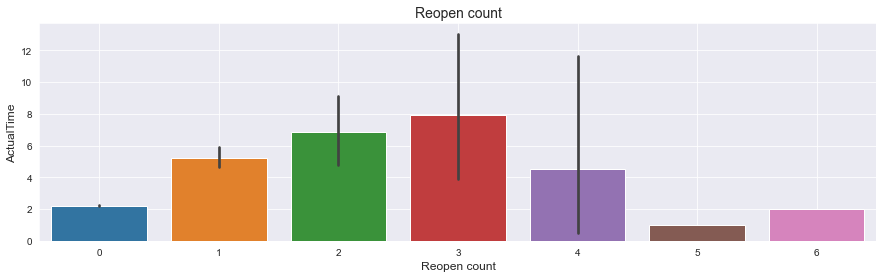

In [176]:
# reopen_count
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(data=df_Tickets_new,x= 'Reopencount',y='ActualTime',ax=ax)
plt.title("Reopen count", size = 14)
plt.xlabel("Reopen count", size=12)
plt.ylabel("ActualTime", size=12)
plt.grid()
plt.show()

In [177]:
df_Tickets_new.groupby('Reopencount')['ActualTimeHrs'].mean().sort_values(ascending=True)

Reopencount
5     290.353611
0     474.011360
6     496.871667
4     863.640185
1    1080.034559
2    1388.600356
3    1622.683434
Name: ActualTimeHrs, dtype: float64

Observation 

    1. Tickets reopened has larger resolution time

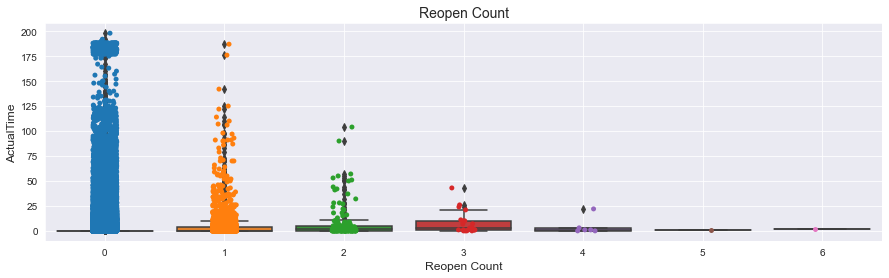

In [178]:
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.boxplot(data=df_Tickets_new,y= 'ActualTime',x='Reopencount',ax=ax)
sns.stripplot(data=df_Tickets_new,y= 'ActualTime',x='Reopencount',ax=ax,jitter=True)
plt.title("Reopen Count", size = 14)
plt.xlabel("Reopen Count", size=12)
plt.ylabel("ActualTime", size=12)
plt.grid()
plt.show()


#### SLA with Actual time 

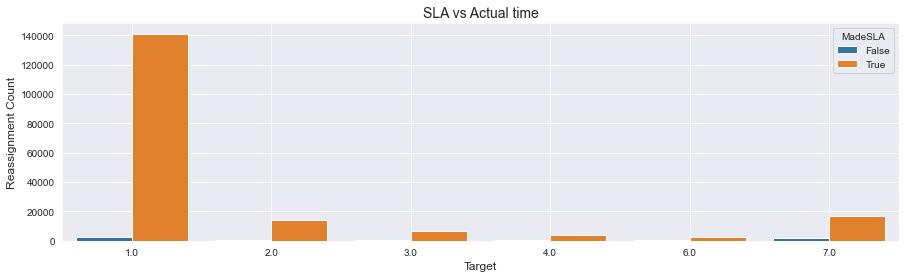

In [179]:
# made_sla
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(data=df_Tickets_new,x='Target',ax=ax,hue='MadeSLA')
plt.title("SLA vs Actual time", size = 14)
plt.xlabel("Target", size=12)
plt.ylabel("Reassignment Count", size=12)
plt.grid()
plt.show()

As seen here the Incidents which failed to maintain the SLA belongs to first category. However the tickets which take most time to get resolved are the ones breaching very SLA.
This is definitely not maintaining industry standard.
Hence we can assume that some of the types of Incidents have more SLA than others.

#### Category with Actual Time 

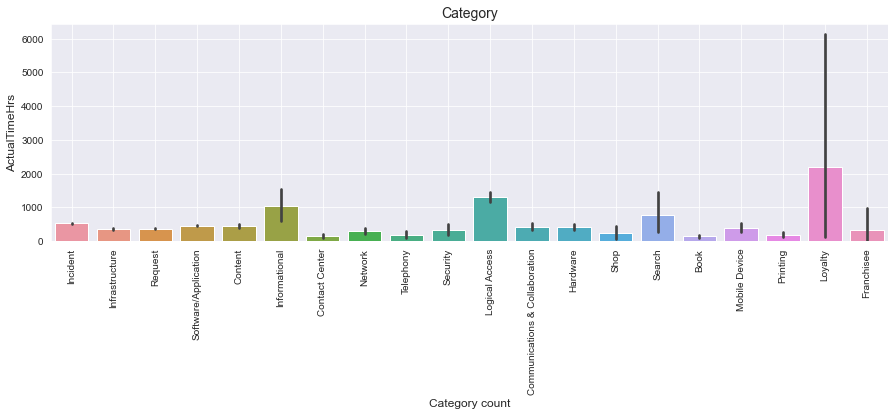

In [180]:
# category
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(data=df_Tickets_new,x='Category',y='ActualTimeHrs',ax=ax)#,hue='made_sla')
plt.title("Category", size = 14)
plt.xlabel("Category count", size=12)
plt.ylabel("ActualTimeHrs", size=12)
plt.xticks(rotation=90)
plt.grid()
plt.show()

Observation 

    1. Informational , Logical access and Loyalty issues is taking larger resolution time 
    2. Contact center shops are taking lesser time

####  Impact /SLA / ActualTime

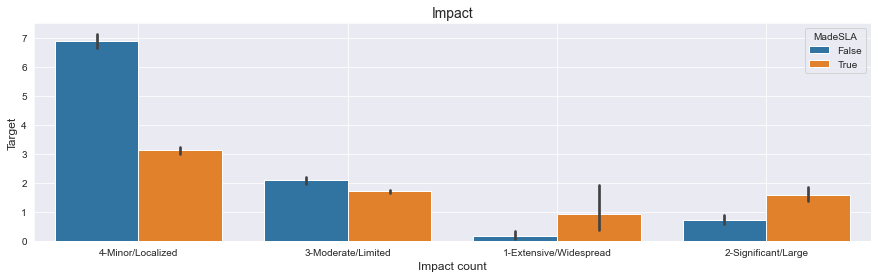

In [181]:
# impact
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(data=df_Tickets_new,x= 'Impact',y='ActualTime',ax=ax,hue='MadeSLA')
plt.title("Impact", size = 14)
plt.xlabel("Impact count", size=12)
plt.ylabel("Target", size=12)
#plt.xticks(rotation=90)
plt.grid()
plt.show()

Observation 

   Business Impact has definetly larger impact on resolution 

#### Urgency vs Actual Time vs MateSLA

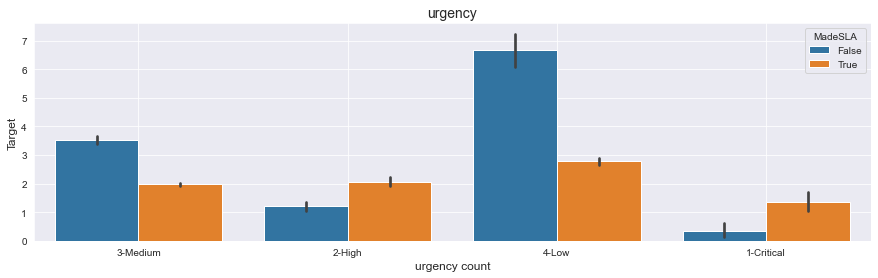

In [182]:
# urgency
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(data=df_Tickets_new,x= 'Urgency',y='ActualTime',ax=ax,hue='MadeSLA')
plt.title("urgency", size = 14)
plt.xlabel("urgency count", size=12)
plt.ylabel("Target", size=12)
#plt.xticks(rotation=90)
plt.grid()
plt.show()

#### Hour vs Actual Time

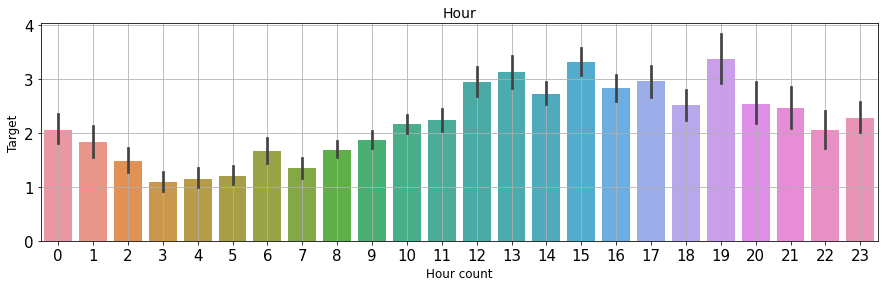

In [259]:
# priority
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(data=df_Tickets_new,x= 'hour',y='ActualTime',ax=ax)
plt.title("Hour", size = 14)
plt.xlabel("Hour count", size=12)
plt.ylabel("Target", size=12)
#plt.xticks(rotation=90)
plt.grid()
plt.show()

Observation 

   Urgency has definetly larger impact on resolution time

#### Priority vs Actual Time vs MateSLA

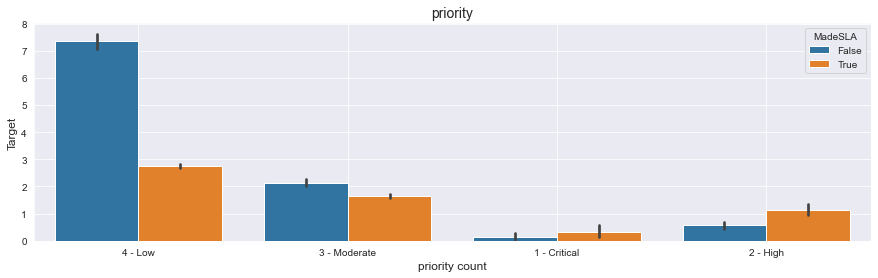

In [183]:
# priority
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(data=df_Tickets_new,x= 'Priority',y='ActualTime',ax=ax,hue='MadeSLA')
plt.title("priority", size = 14)
plt.xlabel("priority count", size=12)
plt.ylabel("Target", size=12)
#plt.xticks(rotation=90)
plt.grid()
plt.show()

#### Days of the week vs Actual Time vs SLA

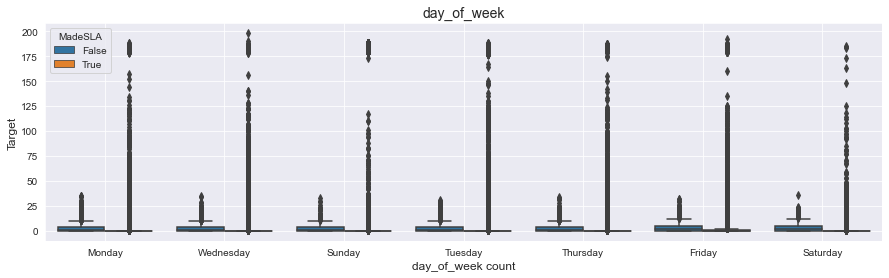

In [184]:
# 'day_of_week'
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.boxplot(data=df_Tickets_new,x='day_of_week',y='ActualTime',ax=ax,hue='MadeSLA')
plt.title("day_of_week", size = 14)
plt.xlabel("day_of_week count", size=12)
plt.ylabel("Target", size=12)
#plt.xticks(rotation=90)
plt.grid()
plt.show()

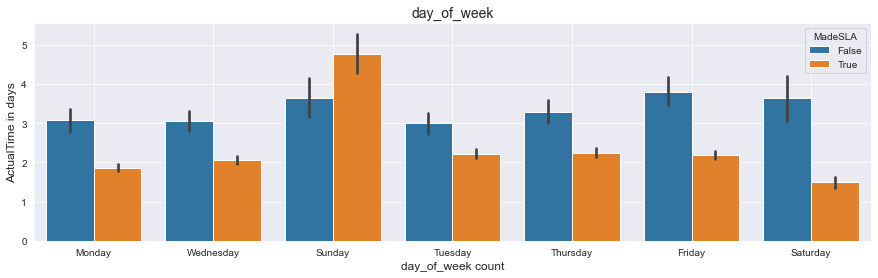

In [185]:
# 'day_of_week'
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(data=df_Tickets_new,x= 'day_of_week',y='ActualTime',ax=ax,hue='MadeSLA')
plt.title("day_of_week", size = 14)
plt.xlabel("day_of_week count", size=12)
plt.ylabel("ActualTime in days", size=12)
#plt.xticks(rotation=90)
plt.grid()
plt.show()

Observation 

    Tickets raised on Sunday has higher resolution time 

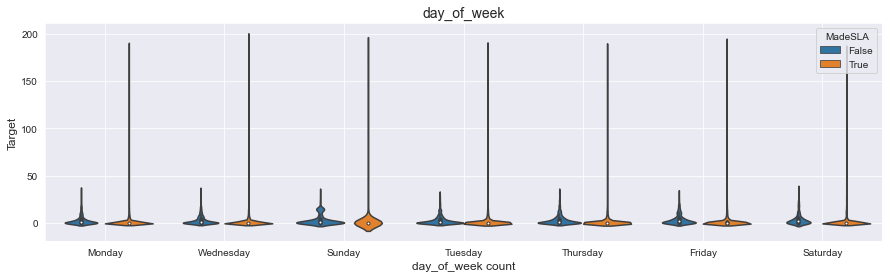

In [186]:
# 'day_of_week'
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.violinplot(data=df_Tickets_new,x= 'day_of_week',y='ActualTime',ax=ax,hue='MadeSLA')
plt.title("day_of_week", size = 14)
plt.xlabel("day_of_week count", size=12)
plt.ylabel("Target", size=12)
#plt.xticks(rotation=90)
plt.grid()
plt.show()

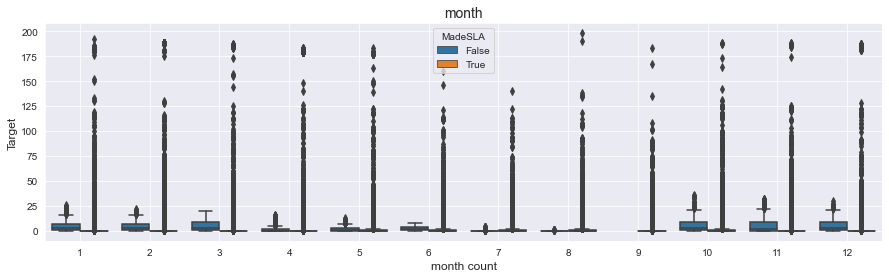

In [187]:
# 'month'
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.boxplot(data=df_Tickets_new,x='month',y='ActualTime',ax=ax,hue='MadeSLA')
plt.title("month", size = 14)
plt.xlabel("month count", size=12)
plt.ylabel("Target", size=12)
#plt.xticks(rotation=90)
plt.grid()
plt.show()

#### Month of the year vs Actual Time vs SLA

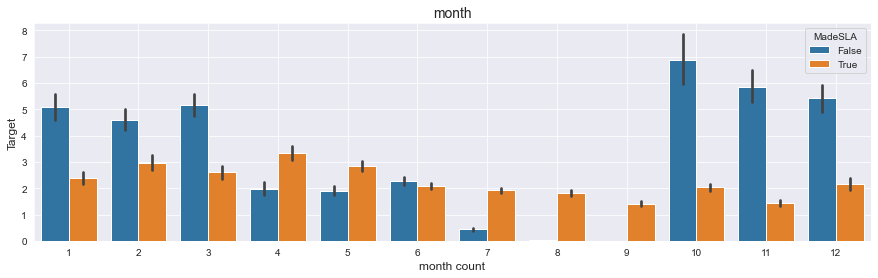

In [188]:
# 'month'
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(data=df_Tickets_new,x= 'month',y='ActualTime',ax=ax,hue='MadeSLA')
plt.title("month", size = 14)
plt.xlabel("month count", size=12)
plt.ylabel("Target", size=12)
#plt.xticks(rotation=90)
plt.grid()
plt.show()

Observed 
    
    1. Oct,Nov and Dec has more breach in SLA. October has the highest . January feb and march has the same impact 
    2. April month has tickets with higher resolution time

#### Day of the month vs Actual Time vs SLA

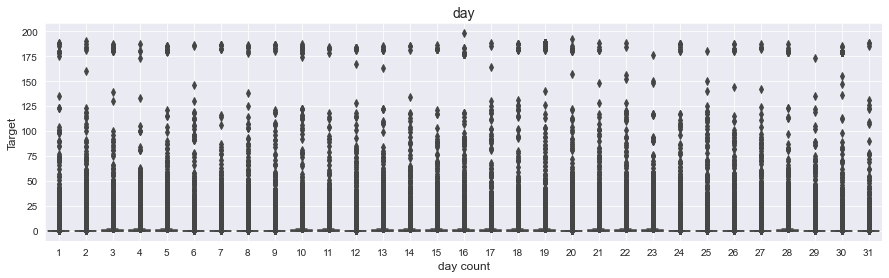

In [189]:
# 'day'
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.boxplot(data=df_Tickets_new,x= 'day',y='ActualTime',ax=ax)#,hue='made_sla')
plt.title("day", size = 14)
plt.xlabel("day count", size=12)
plt.ylabel("Target", size=12)
#plt.xticks(rotation=90)
plt.grid()
plt.show()

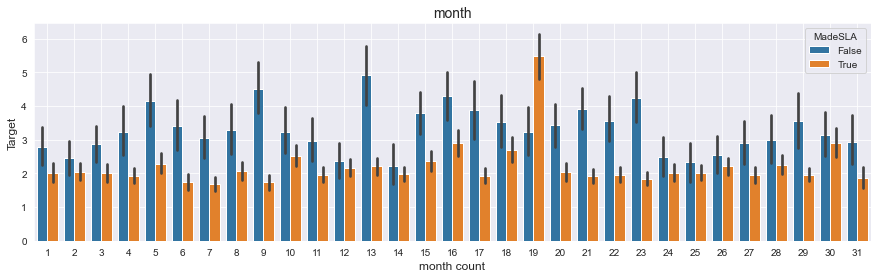

In [190]:
# 'month'
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(data=df_Tickets_new,x= 'day',y='ActualTime',ax=ax,hue='MadeSLA')
plt.title("month", size = 14)
plt.xlabel("month count", size=12)
plt.ylabel("Target", size=12)
#plt.xticks(rotation=90)
plt.grid()
plt.show()

Observation 

    1. 19th of the month has higher resolution time.5th and 13th has similar spikes

#### Distribution of Difference/Actual Time

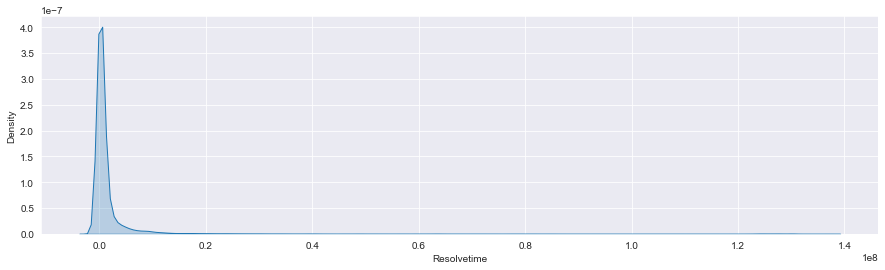

In [191]:
# Lets check the distribution of the dependent variable
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.kdeplot(df_Tickets_new['Resolvetime'],fill=True,cmap="mako")
plt.grid()
plt.show()

D:\softwares\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


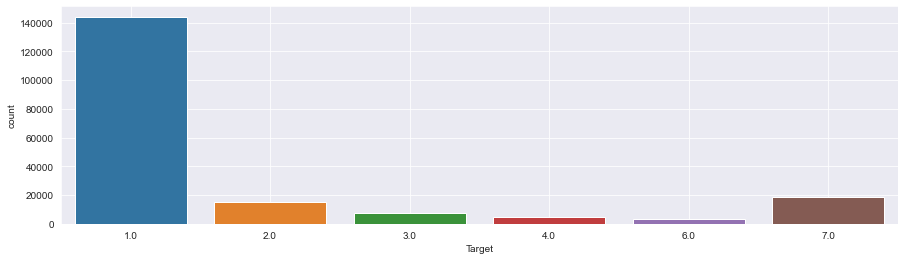

In [192]:
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(df_Tickets_new['Target'])
plt.grid()
plt.show()

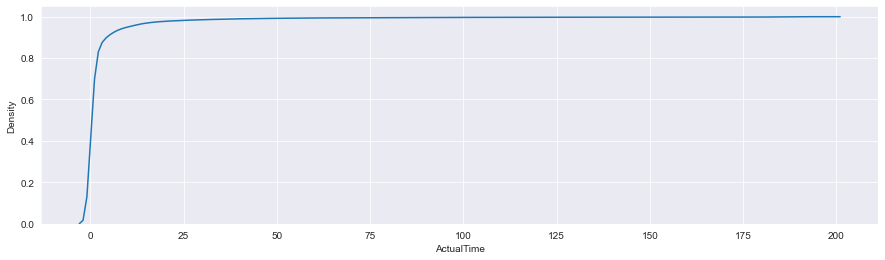

In [193]:
# CDF of the difference
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.kdeplot(df_Tickets_new['ActualTime'],cumulative=True, common_norm=False, common_grid=True)
plt.grid()
plt.show()

At the 'Difference' of < 10 , almost 99% of data is explained. We need to check more closely into the Outliers

#### Removing outliers

In [194]:
df_Tickets_new.Resolvetime.quantile([0.05,.1,0.2 ,.25, .5, .75,.8,.85,.9,.95,.96,.97,.98,.99,1])

0.05    1.110000e+02
0.10    3.090000e+02
0.20    3.156400e+03
0.25    6.714750e+03
0.50    1.036270e+05
0.75    6.942698e+05
0.80    1.099143e+06
0.85    1.749266e+06
0.90    3.195073e+06
0.95    7.163431e+06
0.96    8.863815e+06
0.97    1.090382e+07
0.98    1.572271e+07
0.99    2.843408e+07
1.00    1.371290e+08
Name: Resolvetime, dtype: float64

In [195]:
df_Tickets_new['Target'].unique()

array([7., 1., 3., 6., 2., 4.])

As seen here from the quantile, there is a steep rise from 0.98 percentile to 1. The rise is more than double.
Hence we can consider it to be Outliers and remove data by quantile.
Another observation is that, many of the data points have a closure date of zero.

In [196]:
# Removing Outliers 
cols = ['Resolvetime'] # one or more

Q1 = df_Tickets_new[cols].quantile(0.1)
Q3 = df_Tickets_new[cols].quantile(0.9)
IQR = Q3 - Q1

df_Tickets_new = df_Tickets_new[~((df_Tickets_new[cols] < (Q1 - 1.5 * IQR)) |(df_Tickets_new[cols] > (Q3 + 1.5 * IQR))).any(axis=1)]
df_Tickets_new.columns

Index(['Priority', 'Assignmentgroup', 'AssignedTo', 'Description', 'Closecode',
       'Resolved by', 'Severity', 'ConfigurationItem', 'Category', 'Impact',
       'Urgency', 'Knowledge', 'MadeSLA', 'Reassignmentcount', 'Reopencount',
       'Resolvetime', 'day_of_week', 'month', 'day', 'Difference',
       'ActualTime', 'ActualTimeHrs', 'Target'],
      dtype='object')

In [197]:
df_Tickets_new.ActualTime.quantile([0.05,.1,0.2 ,.25, .5, .75,.8,.85,.9,.95,.96,.97,.98,.99,1])

0.05     0.0
0.10     0.0
0.20     0.0
0.25     0.0
0.50     0.0
0.75     0.0
0.80     1.0
0.85     1.0
0.90     2.0
0.95     5.0
0.96     6.0
0.97     6.0
0.98     7.0
0.99     9.0
1.00    11.0
Name: ActualTime, dtype: float64

In [198]:
df_Tickets_new.shape

(183730, 23)

In [199]:
df_Tickets_new['Target'].unique()

array([1., 7., 3., 6., 2., 4.])

D:\softwares\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


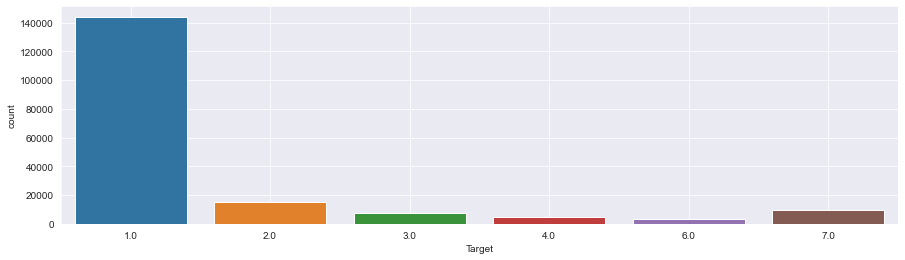

In [200]:
fig_dims = (15, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(df_Tickets_new['Target'])
plt.grid()
plt.show()

In [201]:
df_Tickets_new['Target'].value_counts().to_frame()

,Target
1.0,144049
2.0,15032
7.0,9735
3.0,7408
4.0,4501
6.0,3005


Target value is imbalanced

#### Numerical feature correlation 

In [202]:
num_feat = ['Reassignmentcount','Reopencount']

In [203]:
def create_conrr(mat):
    sns.set_style("dark")
    #plt.figure(figsize=(14, 10))
    ax = sns.heatmap(mat.corr().round(3), annot=True,cmap="YlGnBu")
    plt.grid()
    plt.title("Numerical Feature Correlation", size = 20)
    plt.show()

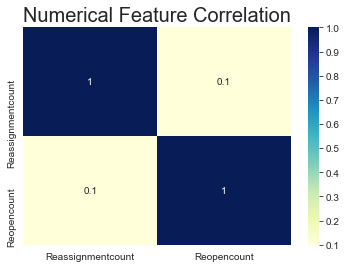

In [204]:
create_conrr(df_Tickets_new[num_feat]) 

0.10 is near to 0 . So it has no corrleation or very less correlation.

#### Data Transformation

In [205]:
df_Tickets_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 183730 entries, 1 to 192307
Data columns (total 23 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Priority           183730 non-null  object 
 1   Assignmentgroup    183730 non-null  object 
 2   AssignedTo         156622 non-null  object 
 3   Description        183625 non-null  object 
 4   Closecode          141713 non-null  object 
 5   Resolved by        183684 non-null  object 
 6   Severity           183730 non-null  object 
 7   ConfigurationItem  179433 non-null  object 
 8   Category           182734 non-null  object 
 9   Impact             183728 non-null  object 
 10  Urgency            183730 non-null  object 
 11  Knowledge          183730 non-null  bool   
 12  MadeSLA            183730 non-null  bool   
 13  Reassignmentcount  183730 non-null  int64  
 14  Reopencount        183730 non-null  int64  
 15  Resolvetime        183730 non-null  int64  
 16  da

Feature selection is often straightforward when working with real-valued input and output data, such as using the Pearson’s correlation coefficient, but can be challenging when working with numerical input data and a categorical target variable.

Feature filtration 

In [206]:
# creating instance of labelencoder
labelencoder = LabelEncoder()
df_Tickets_new['Priority'] = labelencoder.fit_transform(df_Tickets_new['Priority'])

In [207]:
df_Tickets_new.head()

,Priority,Assignmentgroup,AssignedTo,Description,Closecode,Resolved by,Severity,ConfigurationItem,Category,Impact,...,Reassignmentcount,Reopencount,Resolvetime,day_of_week,month,day,Difference,ActualTime,ActualTimeHrs,Target
1,2,PAN RCI NA NP CAB,None,EVR Account Page Layout Change Set needs to be...,Backed Out Change,Sandra Intorcia,3 - Low,Salesforce Office Edition,Infrastructure,3-Moderate/Limited,...,0,0,6273,Wednesday,4,26,0,0,1.742500,1.0
2,2,RCI Affiliate Reporting,None,Caller: Yamila Heavy\nContact Phone: (407) 597...,None,Rossetti Wang,3 - Low,OAC Affiliate Reporting,Request,3-Moderate/Limited,...,1,0,7084376,Sunday,1,12,82,10,1967.882222,7.0
9,3,RCI Affiliate Reporting,None,Good morning\n\nPlease open a ticket for below...,None,Rossetti Wang,3 - Low,IT Services,Request,4-Minor/Localized,...,3,0,1635425,Friday,2,22,18,2,454.284722,3.0
10,3,RCI Affiliate Reporting,None,This has not been resolved. Please reopen the ...,None,Liz Christeson,3 - Low,OAC Affiliate Reporting,Incident,4-Minor/Localized,...,2,0,5751836,Saturday,1,25,66,8,1597.732222,7.0
11,3,RCI Affiliate Reporting,None,User is unable to pull the data from their RCI...,Permissions Issue,James Thompson,3 - Low,RCI Affiliates Mobile App,Software/Application,4-Minor/Localized,...,1,0,242127,Tuesday,1,30,2,0,67.257500,1.0


In [208]:
df_Tickets_new['Severity'] = labelencoder.fit_transform(df_Tickets_new['Severity'])

In [209]:
df_Tickets_new.head(2)

,Priority,Assignmentgroup,AssignedTo,Description,Closecode,Resolved by,Severity,ConfigurationItem,Category,Impact,...,Reassignmentcount,Reopencount,Resolvetime,day_of_week,month,day,Difference,ActualTime,ActualTimeHrs,Target
1,2,PAN RCI NA NP CAB,None,EVR Account Page Layout Change Set needs to be...,Backed Out Change,Sandra Intorcia,1,Salesforce Office Edition,Infrastructure,3-Moderate/Limited,...,0,0,6273,Wednesday,4,26,0,0,1.742500,1.0
2,2,RCI Affiliate Reporting,None,Caller: Yamila Heavy\nContact Phone: (407) 597...,None,Rossetti Wang,1,OAC Affiliate Reporting,Request,3-Moderate/Limited,...,1,0,7084376,Sunday,1,12,82,10,1967.882222,7.0


In [210]:
df_Tickets_new.isna().sum().to_frame() #Checking null values

,0
Priority,0
Assignmentgroup,0
AssignedTo,27108
Description,105
Closecode,42017
Resolved by,46
Severity,0
ConfigurationItem,4297
Category,996
Impact,2


In [211]:
df_Tickets_new.shape

(183730, 23)

In [212]:
df_Tickets_new = df_Tickets_new.dropna(subset=['Impact'], how='all')

In [213]:
df_Tickets_new.shape

(183728, 23)

In [214]:
df_Tickets_new['Impact'] = labelencoder.fit_transform(df_Tickets_new['Impact'])

In [215]:
df_Tickets_new.head(2)

,Priority,Assignmentgroup,AssignedTo,Description,Closecode,Resolved by,Severity,ConfigurationItem,Category,Impact,...,Reassignmentcount,Reopencount,Resolvetime,day_of_week,month,day,Difference,ActualTime,ActualTimeHrs,Target
1,2,PAN RCI NA NP CAB,None,EVR Account Page Layout Change Set needs to be...,Backed Out Change,Sandra Intorcia,1,Salesforce Office Edition,Infrastructure,2,...,0,0,6273,Wednesday,4,26,0,0,1.742500,1.0
2,2,RCI Affiliate Reporting,None,Caller: Yamila Heavy\nContact Phone: (407) 597...,None,Rossetti Wang,1,OAC Affiliate Reporting,Request,2,...,1,0,7084376,Sunday,1,12,82,10,1967.882222,7.0


In [216]:
df_Tickets_new['Urgency'] = labelencoder.fit_transform(df_Tickets_new['Urgency'])

In [217]:
# use groupby() to generate mean
#groupby('network')['duration'].sum()
df_Tickets_new.groupby('Closecode')['ActualTime'].mean().sort_values(ascending=False)

Closecode
Primary NAP Hardware Issue    4.250000
Hard Drive Fail               2.750000
SSL Certificate Modified      2.500000
DNS Entry Changed             2.428571
Rename OST                    2.333333
                                ...   
SSL Replace                   0.000000
Node Error                    0.000000
Modified Knowledge Article    0.000000
Metric Agt Error              0.000000
Packet Loss / Brief Hit       0.000000
Name: ActualTime, Length: 217, dtype: float64

Observation 

    1. Primary NAP Hardware Issue takes the highest amount of time followed by SSL Certificate Modified
    2. Defintely closed code plays an important role in actual time detection

In [218]:
df_Tickets_new['Knowledge'] = labelencoder.fit_transform(df_Tickets_new['Knowledge'])

In [219]:
df_Tickets_new['MadeSLA'] = labelencoder.fit_transform(df_Tickets_new['MadeSLA'])

In [220]:
df_Tickets_new['day_of_week'] = labelencoder.fit_transform(df_Tickets_new['day_of_week'])

In [221]:
df_Tickets_new.head(5)

,Priority,Assignmentgroup,AssignedTo,Description,Closecode,Resolved by,Severity,ConfigurationItem,Category,Impact,...,Reassignmentcount,Reopencount,Resolvetime,day_of_week,month,day,Difference,ActualTime,ActualTimeHrs,Target
1,2,PAN RCI NA NP CAB,None,EVR Account Page Layout Change Set needs to be...,Backed Out Change,Sandra Intorcia,1,Salesforce Office Edition,Infrastructure,2,...,0,0,6273,6,4,26,0,0,1.742500,1.0
2,2,RCI Affiliate Reporting,None,Caller: Yamila Heavy\nContact Phone: (407) 597...,None,Rossetti Wang,1,OAC Affiliate Reporting,Request,2,...,1,0,7084376,3,1,12,82,10,1967.882222,7.0
9,3,RCI Affiliate Reporting,None,Good morning\n\nPlease open a ticket for below...,None,Rossetti Wang,1,IT Services,Request,3,...,3,0,1635425,0,2,22,18,2,454.284722,3.0
10,3,RCI Affiliate Reporting,None,This has not been resolved. Please reopen the ...,None,Liz Christeson,1,OAC Affiliate Reporting,Incident,3,...,2,0,5751836,2,1,25,66,8,1597.732222,7.0
11,3,RCI Affiliate Reporting,None,User is unable to pull the data from their RCI...,Permissions Issue,James Thompson,1,RCI Affiliates Mobile App,Software/Application,3,...,1,0,242127,5,1,30,2,0,67.257500,1.0


In [222]:
# use groupby() to generate mean
df_Tickets_new.groupby('Resolved by')['ActualTimeHrs'].mean().sort_values(ascending=False).to_frame()

,ActualTimeHrs
Resolved by,
Ruqiya Tasneem,2203.749167
Ritin Das,2158.771944
Saptak Patra,2017.212500
Suresh Bollineni,2004.496111
Dana Dahmani,1963.983056
...,...
Keith McConville,0.076944
Tanmoy Debnath,0.063889
Sean Hughes,0.046111


In [223]:
# use groupby() to generate mean
df_Tickets_new.groupby('Resolved by')['ActualTimeHrs'].median().sort_values(ascending=False).to_frame()

,ActualTimeHrs
Resolved by,
Ruqiya Tasneem,2203.749167
Suresh Velagapudi,2157.703611
Ritin Das,2137.495833
Saptak Patra,2017.212500
Suresh Bollineni,2004.496111
...,...
Michele Maillet,0.028611
Darren Carroll,0.028333
Andrew Mclaughlan,0.024722


Observation :
    
    1. Mean/Median is almost same . More or less we can say that there is not much outliers

Dropping rows with empty resolved by cases

In [224]:
df_Tickets_new.shape

(183728, 23)

In [225]:
df_Tickets_new = df_Tickets_new.dropna(subset=['Resolved by'], how='all')

In [226]:
df_Tickets_new.shape

(183682, 23)

In [227]:
df_Tickets_test = df_Tickets_new.copy()

We would create 10 classes

0 to 200:-      1
200 to 400:-    2
400 to 600:-    3
600 to 800:-    4
800 to 1000:-   5
1000 to 1200:-  6
1200 to 1400:-  7
1400 to 1600:-  8
1600 to 1800:-  9
1800 and above:-10

In [228]:
def binning(arr):
    bins = np.empty(arr.shape[0])
    for idx, x in enumerate(arr):
        if (x >= 0) & (x < 200):
            bins[idx] = 1
        elif (x >= 200) & (x < 400):
            bins[idx] = 2
        elif (x >= 400) & (x < 600):
            bins[idx] = 3
        elif (x >= 600) & (x < 800):
            bins[idx] = 4
        elif (x >= 800) & (x < 1000):
            bins[idx] = 5
        elif (x >= 1000) & (x < 1200):
            bins[idx] = 6
        elif (x >= 1200) & (x < 1400):
            bins[idx] = 7
        elif (x >= 1400) & (x < 1600):
            bins[idx] = 8
        elif (x >= 1600) & (x < 1800):
            bins[idx] = 9
        else:
            bins[idx] = 10
    return bins

In [229]:
df_Tickets_test['MeanAvgEffort'] = df_Tickets_test.groupby('Resolved by')['ActualTimeHrs'].transform('mean')

In [230]:
df_Tickets_test['Performance'] = binning(df_Tickets_test['MeanAvgEffort'].to_numpy())

In [231]:
df_Tickets_test.head(5)

,Priority,Assignmentgroup,AssignedTo,Description,Closecode,Resolved by,Severity,ConfigurationItem,Category,Impact,...,Resolvetime,day_of_week,month,day,Difference,ActualTime,ActualTimeHrs,Target,MeanAvgEffort,Performance
1,2,PAN RCI NA NP CAB,None,EVR Account Page Layout Change Set needs to be...,Backed Out Change,Sandra Intorcia,1,Salesforce Office Edition,Infrastructure,2,...,6273,6,4,26,0,0,1.742500,1.0,1.742500,1.0
2,2,RCI Affiliate Reporting,None,Caller: Yamila Heavy\nContact Phone: (407) 597...,None,Rossetti Wang,1,OAC Affiliate Reporting,Request,2,...,7084376,3,1,12,82,10,1967.882222,7.0,846.292832,5.0
9,3,RCI Affiliate Reporting,None,Good morning\n\nPlease open a ticket for below...,None,Rossetti Wang,1,IT Services,Request,3,...,1635425,0,2,22,18,2,454.284722,3.0,846.292832,5.0
10,3,RCI Affiliate Reporting,None,This has not been resolved. Please reopen the ...,None,Liz Christeson,1,OAC Affiliate Reporting,Incident,3,...,5751836,2,1,25,66,8,1597.732222,7.0,719.021667,4.0
11,3,RCI Affiliate Reporting,None,User is unable to pull the data from their RCI...,Permissions Issue,James Thompson,1,RCI Affiliates Mobile App,Software/Application,3,...,242127,5,1,30,2,0,67.257500,1.0,34.597986,1.0


In [232]:
df_Tickets_new['Target'].unique()

array([1., 7., 3., 6., 2., 4.])

In [233]:
df_Tickets_new = df_Tickets_test.copy()

In [234]:
categorical_feature = ['Priority','Performance', 'Severity',
       'Impact', 'Urgency', 'Knowledge', 'MadeSLA',
       'Reassignmentcount', 'Reopencount', 'day_of_week', 'month', 'day']

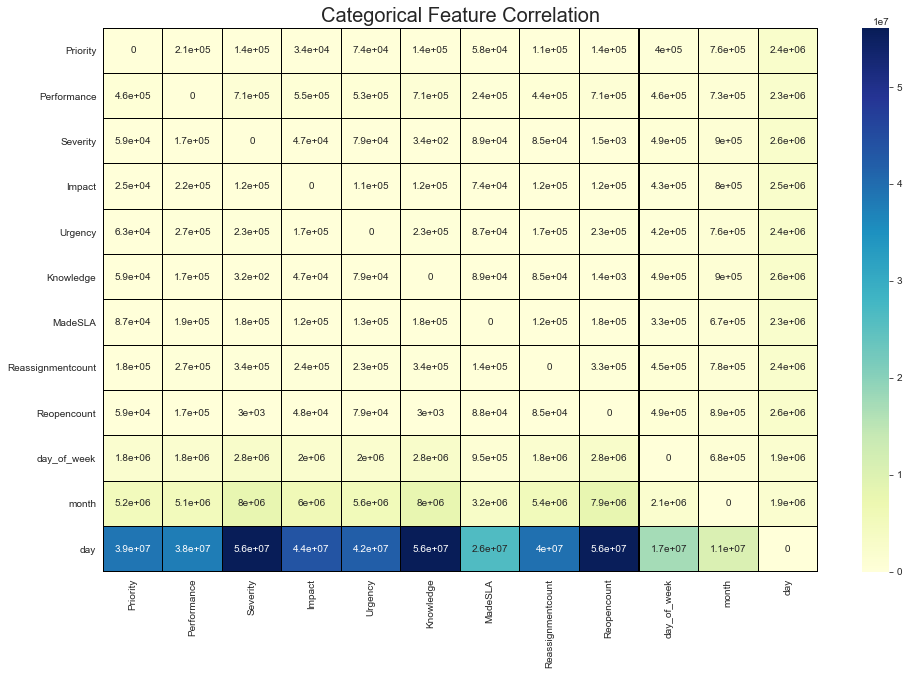

In [235]:
df = df_Tickets_new[categorical_feature]

df=df.apply(lambda x : pd.factorize(x)[0])+1

df = pd.DataFrame([chisquare(df[x].values,f_exp=df.values.T,axis=1)[0] for x in df],columns=categorical_feature,index=categorical_feature)
sns.set_style("dark")
plt.figure(figsize=(16, 10))
sns.heatmap(df.round(3), annot=True,cmap="YlGnBu",linecolor='black',linewidths=0.05)
plt.grid()
plt.title("Categorical Feature Correlation", size = 20)
plt.show()

Feature: Day comes out as highly Correlated in our Chi-Square test. Hence we can drop this feature.

In [236]:
df_Tickets_final = df_Tickets_new.copy()

In [237]:
np.sort(df_Tickets_final['Target'].unique())

array([1., 2., 3., 4., 6., 7.])

In [238]:
df_Tickets_final.drop('AssignedTo', axis=1, inplace=True)
df_Tickets_final.drop('Description', axis=1, inplace=True)
df_Tickets_final.drop('Resolved by', axis=1, inplace=True)
df_Tickets_final.drop('Resolvetime', axis=1, inplace=True)
df_Tickets_final.drop('ActualTime', axis=1, inplace=True)
df_Tickets_final.drop('MeanAvgEffort', axis=1, inplace=True)
#df_Tickets_final.drop('ActualTimeHrs', axis=1, inplace=True)
df_Tickets_final.drop('Difference', axis=1, inplace=True)


In [239]:
df_Tickets_final.drop('Closecode', axis=1, inplace=True)

In [240]:
df_Tickets_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 183682 entries, 1 to 192307
Data columns (total 17 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Priority           183682 non-null  int32  
 1   Assignmentgroup    183682 non-null  object 
 2   Severity           183682 non-null  int32  
 3   ConfigurationItem  179388 non-null  object 
 4   Category           182688 non-null  object 
 5   Impact             183682 non-null  int32  
 6   Urgency            183682 non-null  int32  
 7   Knowledge          183682 non-null  int64  
 8   MadeSLA            183682 non-null  int64  
 9   Reassignmentcount  183682 non-null  int64  
 10  Reopencount        183682 non-null  int64  
 11  day_of_week        183682 non-null  int32  
 12  month              183682 non-null  int64  
 13  day                183682 non-null  int64  
 14  ActualTimeHrs      183682 non-null  float64
 15  Target             183682 non-null  float64
 16  Pe

#### Feature selection 

In [241]:
df_Tickets_feature_test = df_Tickets_final.copy()

In [242]:
df_Tickets_feature_test['Assignmentgroup'] = labelencoder.fit_transform(df_Tickets_feature_test['Assignmentgroup'])
df_Tickets_feature_test['Category'] = labelencoder.fit_transform(df_Tickets_feature_test['Category'])

In [243]:
df_Tickets_feature_test['ConfigurationItem'] = labelencoder.fit_transform(df_Tickets_feature_test['ConfigurationItem'])

In [244]:
df_Tickets_feature_test.drop('Reassignmentcount', axis=1, inplace=True)
df_Tickets_feature_test.drop('Reopencount', axis=1, inplace=True)

In [245]:
df_Tickets_feature_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 183682 entries, 1 to 192307
Data columns (total 15 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Priority           183682 non-null  int32  
 1   Assignmentgroup    183682 non-null  int32  
 2   Severity           183682 non-null  int32  
 3   ConfigurationItem  183682 non-null  int32  
 4   Category           183682 non-null  int32  
 5   Impact             183682 non-null  int32  
 6   Urgency            183682 non-null  int32  
 7   Knowledge          183682 non-null  int64  
 8   MadeSLA            183682 non-null  int64  
 9   day_of_week        183682 non-null  int32  
 10  month              183682 non-null  int64  
 11  day                183682 non-null  int64  
 12  ActualTimeHrs      183682 non-null  float64
 13  Target             183682 non-null  float64
 14  Performance        183682 non-null  float64
dtypes: float64(3), int32(8), int64(4)
memory usage: 16.

In [166]:
data=df_Tickets_feature_test.drop(['Target'],axis=1)
label=df_Tickets_feature_test['Target']

In [167]:
#df_Tickets_final.drop('ActualTimeHrs', axis=1, inplace=True)

In [168]:
def show_top_univariate_filters(x_input, y_target, score_func):
   
    if score_func == "chi2":
        func = chi2
    # Annova
    elif score_func == "f_classif":
        func = f_classif
    elif score_func == "mutual_info_classif":
        func = mutual_info_classif
   
    #apply SelectKBest class to extract top k best features
    bestfeatures = SelectKBest(score_func=func, k=10)
    fit = bestfeatures.fit(x_input,y_target)

    dfscores = pd.DataFrame(fit.scores_)
    dfcolumns = pd.DataFrame(x_input.columns)

    #concat two dataframes for better visualization
    featureScores = pd.concat([dfcolumns,dfscores],axis=1)
    featureScores.columns = ['Specs','Score']  #naming the dataframe columns
    print(featureScores.nlargest(10,'Score'))  #print top_k best features


In [169]:
show_top_univariate_filters(data,label,'chi2')

                Specs         Score
12        Performance  14337.208618
1     Assignmentgroup   5824.276154
3   ConfigurationItem   4548.297770
4            Category    588.809043
7           Knowledge    367.364240
8             MadeSLA    145.225944
11                day    133.014710
9         day_of_week     48.281652
10              month     43.196010
0            Priority     37.997566


In [247]:
df_Tickets_feature_test.drop('Target', axis=1, inplace=True)

In [248]:
data=df_Tickets_feature_test.drop(['ActualTimeHrs'],axis=1)
label=df_Tickets_feature_test['ActualTimeHrs']

In [252]:
show_top_univariate_filters(data,label,'f_classif')

              Specs      Score
7         Knowledge  15.388745
2          Severity   5.177677
12      Performance   3.219385
8           MadeSLA   1.699761
1   Assignmentgroup   1.328480
6           Urgency   1.217919
9       day_of_week   1.010275
10            month   0.998860
0          Priority   0.995746
11              day   0.980525


In [253]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 183682 entries, 1 to 192307
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Priority           183682 non-null  int32  
 1   Assignmentgroup    183682 non-null  int32  
 2   Severity           183682 non-null  int32  
 3   ConfigurationItem  183682 non-null  int32  
 4   Category           183682 non-null  int32  
 5   Impact             183682 non-null  int32  
 6   Urgency            183682 non-null  int32  
 7   Knowledge          183682 non-null  int64  
 8   MadeSLA            183682 non-null  int64  
 9   day_of_week        183682 non-null  int32  
 10  month              183682 non-null  int64  
 11  day                183682 non-null  int64  
 12  Performance        183682 non-null  float64
dtypes: float64(1), int32(8), int64(4)
memory usage: 14.0 MB


In [254]:
#one hot encoding of Assignment group column
assignment_groups = df_Tickets_final['Assignmentgroup']
#type(vehicle_age_types)
assignment_df = pd.DataFrame(assignment_groups,columns=['Assignmentgroup'])
dummy_df = pd.get_dummies(assignment_df, columns=["Assignmentgroup"], prefix=["Assignment_is"] )
df_Tickets_final = df_Tickets_final.join(dummy_df)
df_Tickets_final.head()

,Priority,Assignmentgroup,Severity,ConfigurationItem,Category,Impact,Urgency,Knowledge,MadeSLA,Reassignmentcount,...,Assignment_is_WVC Sales Marketing L2 Support,Assignment_is_WVC Salesforce Admin,Assignment_is_WVC Software Config Management,Assignment_is_WVC System Software Engineering,Assignment_is_WVC TIPS Support,Assignment_is_WVC Test Environment Management,Assignment_is_WVC VIP Admin,Assignment_is_WVC Voyager,Assignment_is_WVC Voyager L2 Support,Assignment_is_WVC Workflow Ops
1,2,PAN RCI NA NP CAB,1,Salesforce Office Edition,Infrastructure,2,2,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,RCI Affiliate Reporting,1,OAC Affiliate Reporting,Request,2,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
9,3,RCI Affiliate Reporting,1,IT Services,Request,3,2,0,1,3,...,0,0,0,0,0,0,0,0,0,0
10,3,RCI Affiliate Reporting,1,OAC Affiliate Reporting,Incident,3,2,0,1,2,...,0,0,0,0,0,0,0,0,0,0
11,3,RCI Affiliate Reporting,1,RCI Affiliates Mobile App,Software/Application,3,2,0,1,1,...,0,0,0,0,0,0,0,0,0,0


In [255]:
df_Tickets_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 183682 entries, 1 to 192307
Columns: 153 entries, Priority to Assignment_is_WVC Workflow Ops
dtypes: float64(3), int32(5), int64(6), object(3), uint8(136)
memory usage: 49.6+ MB


In [256]:
df_Tickets_final.shape

(183682, 153)

In [257]:
df_Tickets_new = df_Tickets_new.dropna(subset=['Category'], how='all')

In [258]:
df_Tickets_final.shape

(183682, 153)

In [259]:
df_Tickets_new.isna().sum().to_frame() #Checking null values

,0
Priority,0
Assignmentgroup,0
AssignedTo,27074
Description,103
Closecode,41015
Resolved by,0
Severity,0
ConfigurationItem,4294
Category,0
Impact,0


In [260]:
#one hot encoding of Assignment group column
category_items = df_Tickets_final['Category']
#type(vehicle_age_types)
category_df = pd.DataFrame(category_items,columns=['Category'])
dummy_df = pd.get_dummies(category_df, columns=["Category"], prefix=["category_is"] )
df_Tickets_final = df_Tickets_final.join(dummy_df)
df_Tickets_final.head()

,Priority,Assignmentgroup,Severity,ConfigurationItem,Category,Impact,Urgency,Knowledge,MadeSLA,Reassignmentcount,...,category_is_Loyalty,category_is_Mobile Device,category_is_Network,category_is_Printing,category_is_Request,category_is_Search,category_is_Security,category_is_Shop,category_is_Software/Application,category_is_Telephony
1,2,PAN RCI NA NP CAB,1,Salesforce Office Edition,Infrastructure,2,2,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,RCI Affiliate Reporting,1,OAC Affiliate Reporting,Request,2,1,0,1,1,...,0,0,0,0,1,0,0,0,0,0
9,3,RCI Affiliate Reporting,1,IT Services,Request,3,2,0,1,3,...,0,0,0,0,1,0,0,0,0,0
10,3,RCI Affiliate Reporting,1,OAC Affiliate Reporting,Incident,3,2,0,1,2,...,0,0,0,0,0,0,0,0,0,0
11,3,RCI Affiliate Reporting,1,RCI Affiliates Mobile App,Software/Application,3,2,0,1,1,...,0,0,0,0,0,0,0,0,1,0


In [261]:
df_Tickets_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 183682 entries, 1 to 192307
Columns: 173 entries, Priority to category_is_Telephony
dtypes: float64(3), int32(5), int64(6), object(3), uint8(156)
memory usage: 53.1+ MB


In [262]:
#df_Tickets_final.drop('Reassignmentcount', axis=1, inplace=True)
#df_Tickets_final.drop('Reopencount', axis=1, inplace=True)
df_Tickets_final.drop('Assignmentgroup', axis=1, inplace=True)
df_Tickets_final.drop('ConfigurationItem', axis=1, inplace=True)
df_Tickets_final.drop('Category', axis=1, inplace=True)

In [263]:
#num_feat = ['Reassignmentcount','Reopencount']

In [264]:
#Normalizing the data using Min-Max normalization technique
from sklearn import preprocessing
scaler = preprocessing.MinMaxScaler()
#names = x.columns
d = scaler.fit_transform(df_Tickets_final[num_feat])
num_df = pd.DataFrame(d, columns=num_feat)

In [265]:
num_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 183682 entries, 0 to 183681
Data columns (total 2 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Reassignmentcount  183682 non-null  float64
 1   Reopencount        183682 non-null  float64
dtypes: float64(2)
memory usage: 2.8 MB


In [266]:
num_df.shape

(183682, 2)

In [267]:
df_Tickets_final.drop('Reassignmentcount', axis=1, inplace=True)
df_Tickets_final.drop('Reopencount', axis=1, inplace=True)

In [268]:
df_Tickets_final.join(num_df)

,Priority,Severity,Impact,Urgency,Knowledge,MadeSLA,day_of_week,month,day,ActualTimeHrs,...,category_is_Network,category_is_Printing,category_is_Request,category_is_Search,category_is_Security,category_is_Shop,category_is_Software/Application,category_is_Telephony,Reassignmentcount,Reopencount
1,2,1,2,2,0,0,6,4,26,1.742500,...,0,0,0,0,0,0,0,0,0.045455,0.0
2,2,1,2,1,0,1,3,1,12,1967.882222,...,0,0,1,0,0,0,0,0,0.136364,0.0
9,3,1,3,2,0,1,0,2,22,454.284722,...,0,0,1,0,0,0,0,0,0.136364,0.0
10,3,1,3,2,0,1,2,1,25,1597.732222,...,0,0,0,0,0,0,0,0,0.045455,0.0
11,3,1,3,2,0,1,5,1,30,67.257500,...,0,0,0,0,0,0,1,0,0.045455,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192303,2,1,2,2,0,1,5,2,2,0.101944,...,0,0,0,0,0,0,0,0,NaN,NaN
192304,3,1,2,3,0,1,5,5,26,23.864167,...,0,0,0,0,0,0,0,0,NaN,NaN
192305,3,1,3,2,0,1,1,10,4,0.188611,...,0,0,1,0,0,0,0,0,NaN,NaN
192306,2,1,1,2,0,1,2,5,8,1.696667,...,0,0,0,0,0,0,0,0,NaN,NaN


In [1]:
df_Tickets_final.info()

NameError: name 'df_Tickets_final' is not defined

In [269]:
df_Tickets_final.to_parquet('D:/datascience/support_ticket_classification/ticket_resolution_phase2.parquet') 

In [271]:
df_Ticket_model = pd.read_parquet('D:/datascience/support_ticket_classification/ticket_resolution_phase2.parquet', engine='fastparquet')

In [272]:
df_Ticket_model['Target']

index
1         1.0
2         7.0
9         3.0
10        7.0
11        1.0
         ... 
192303    1.0
192304    1.0
192305    1.0
192306    1.0
192307    1.0
Name: Target, Length: 183682, dtype: float64

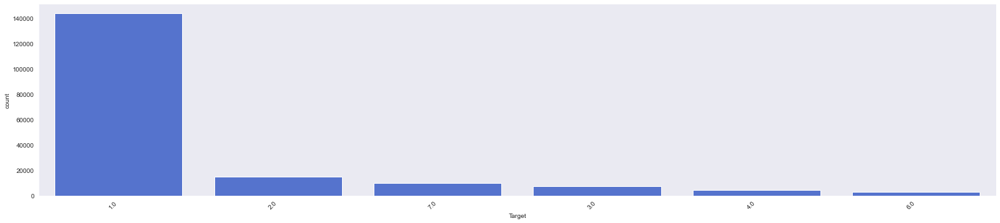

In [273]:
#Create Dataset for 'others' i.e all groups which is not part of GRP_0
#itTicketOthersDF = itTicketDF[itTicketDF['Assignment group'] != 'GRP_0']

descending_order = df_Ticket_model['Target'].value_counts().sort_values(ascending=False).index
plt.subplots(figsize=(22,5))
#add code to rotate the labels
ax=sns.countplot(x='Target', data=df_Ticket_model, color='royalblue',order=descending_order)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
plt.tight_layout()
plt.show()

In [274]:
df_Ticket_model.shape

(183682, 168)

In [275]:
maxOthers = df_Ticket_model['Target'].value_counts().max()
maxOthers

144019

#### Sampling method

In [250]:
def sampling_data(X,y,option="SMOTE",strategy = "auto",n_jobs=1):
    if option.lower()=="smote":
        smo = SMOTE(random_state=52,sampling_strategy = strategy,n_jobs=n_jobs)
        smo.fit(X, y)
        X_resampled, y_resampled = smo.fit_resample(X, y)
        return X_resampled,y_resampled
    elif option.lower()=="undersample":
        rus = RandomUnderSampler(random_state=42,sampling_strategy = strategy)
        rus.fit(X, y)
        X_resampled, y_resampled = rus.fit_resample(X, y)
        return X_resampled,y_resampled
    elif option.lower()=="oversample":
        ros = RandomOverSampler(random_state=42,sampling_strategy = strategy)
        ros.fit(X, y)
        X_resampled, y_resampled = ros.fit_resample(X, y)
        return X_resampled,y_resampled
    elif option.lower()=="nearmiss":
        near = NearMiss(sampling_strategy = strategy,n_jobs=n_jobs)
        near.fit(X, y)
        X_resampled, y_resampled = near.fit_resample(X, y)
        return X_resampled,y_resampled
    else:
        print("Please select from the below options: ")
        print("1: Undersample || 2: Oversample || 3: Nearmiss || 4. SMOTE")

In [251]:
df_Ticket_model.shape

(183682, 167)

In [252]:

data=df_Ticket_model.drop(['Target'],axis=1)
label=df_Ticket_model['Target']


In [253]:
data.shape,label.shape

((183682, 166), (183682,))

In [254]:
X_train, test_data, y_train, y_test = train_test_split(
    data, label, test_size=0.2, random_state=123)
train_data,val_data,y_train,y_val = train_test_split(
    X_train, y_train, test_size=0.25, random_state=2)

In [255]:
# Splitting the data into train and test
#X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.33, random_state=42)
#X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, random_state=42)

In [260]:
train_data.shape,test_data.shape,val_data.shape

((519096, 166), (36737, 166), (36737, 166))

In [269]:
X_sam,y_sam = sampling_data(train_data,y_train,option="smote",strategy = "auto",n_jobs=4)

In [270]:
X_sam.shape

(519096, 166)

In [271]:
train_data.shape,test_data.shape,val_data.shape

((519096, 166), (36737, 166), (36737, 166))

#### Baseline Model

In [272]:
# This function will provide result to oour classification model
def validate_result(y_true, y_pred,y_prob,model="Model"):
    print(f"The Result for the {model} Classification is a Below\n")
    fig, ax = plt.subplots(figsize=(15,5))
    conf = confusion_matrix(y_true, y_pred).round(3)
    b = sns.heatmap(conf.round(3), cmap="YlGnBu",annot=True,ax = ax)
    b.axes.set_title("Confusion Matrix",fontsize=20)
    b.set_xlabel("Predicted Value",fontsize=16)
    b.set_ylabel("True Value",fontsize=16)
    b.tick_params(labelsize=16)
    print("=="*50)
    print(f"Recall Score: {(recall_score(y_true, y_pred,average='weighted')*100).round(3)} %")
    print(f"Precision Score: {(precision_score(y_true, y_pred,average='weighted')*100).round(3)} %")
    print("F1 Score: ",f1_score(y_true, y_pred,average='weighted').round(3))
    print("Log Loss: ",log_loss(y_true, y_prob).round(3))
    report = classification_report(y_true, y_pred, output_dict=True)
    df = pd.DataFrame(report).transpose()
    print("Classification Report:\n",df.round(3))

#### Naive Bayes

In [273]:
clf = GaussianNB()
clf.fit(X_sam,y_sam)

GaussianNB()

The Result for the GaussianNB Classification is a Below

Recall Score: 26.535 %
Precision Score: 73.874 %
F1 Score:  0.375
Log Loss:  24.228
Classification Report:
               precision  recall  f1-score    support
1.0               0.916   0.302     0.454  28836.000
2.0               0.094   0.069     0.080   3002.000
3.0               0.050   0.089     0.064   1450.000
4.0               0.030   0.150     0.049    896.000
6.0               0.020   0.546     0.039    606.000
7.0               0.174   0.128     0.148   1947.000
accuracy          0.265   0.265     0.265      0.265
macro avg         0.214   0.214     0.139  36737.000
weighted avg      0.739   0.265     0.375  36737.000


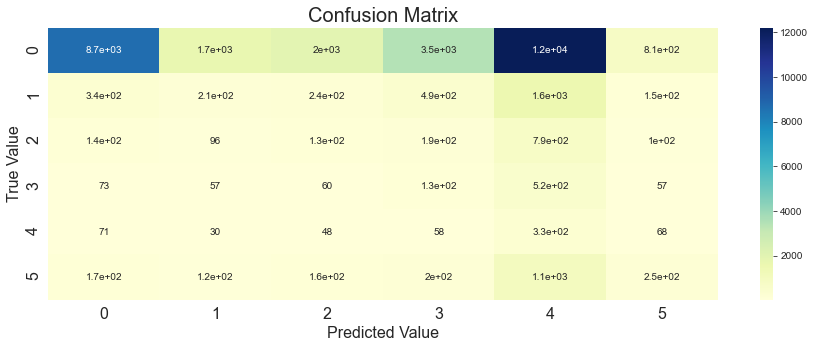

In [274]:
validate_result(y_val,clf.predict(val_data),clf.predict_proba(val_data),model="GaussianNB")

#### KNN

In [95]:
param = {'n_neighbors':[3,5,7,9,11,13]}

In [96]:

knn_rand = RandomizedSearchCV(KNeighborsClassifier(),param,verbose=50,return_train_score=True,scoring='f1_macro',cv=3,n_jobs=5)
knn_rand.fit(train_data,y_train)

C:\Users\ashis\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_search.py:292: UserWarning: The total space of parameters 6 is smaller than n_iter=10. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 3 folds for each of 6 candidates, totalling 18 fits


RandomizedSearchCV(cv=3, estimator=KNeighborsClassifier(), n_jobs=5,
                   param_distributions={'n_neighbors': [3, 5, 7, 9, 11, 13]},
                   return_train_score=True, scoring='f1_macro', verbose=50)

In [97]:
knn_rand.best_estimator_

KNeighborsClassifier(n_neighbors=3)

KNN with 3 nearest neighbour gives better result

In [29]:
clf = KNeighborsClassifier(n_neighbors=3)
clf.fit(train_data,y_train)

KNeighborsClassifier(n_neighbors=3)

The Result for the KNN with N=3 Classification is a Below

Recall Score: 72.013 %
Precision Score: 76.589 %
F1 Score:  0.74
Log Loss:  6.73
Classification Report:
               precision  recall  f1-score   support
1.0               0.901   0.818     0.857  28815.00
2.0               0.281   0.423     0.338   3054.00
3.0               0.235   0.319     0.270   1459.00
4.0               0.223   0.276     0.247    906.00
6.0               0.196   0.250     0.220    571.00
7.0               0.347   0.387     0.366   1941.00
accuracy          0.720   0.720     0.720      0.72
macro avg         0.364   0.412     0.383  36746.00
weighted avg      0.766   0.720     0.740  36746.00


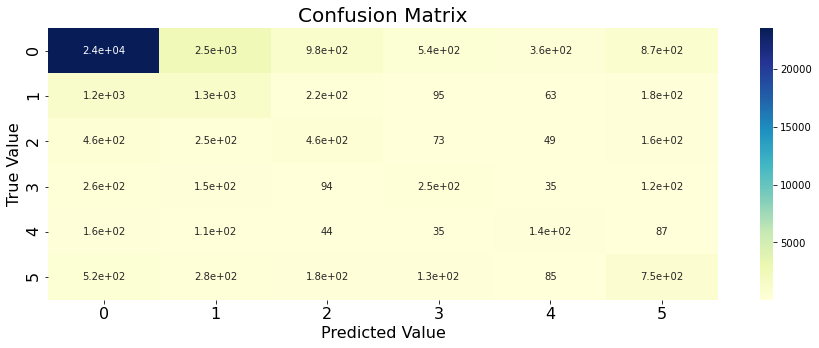

In [30]:
validate_result(y_val,clf.predict(val_data),clf.predict_proba(val_data),model="KNN with N=3")

#### Logistic Regression with SGDClassifier

In [33]:
param = {'alpha': [1e-4, 1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2, 1e3],'penalty': ['l2','l1']}

log_rand = RandomizedSearchCV(SGDClassifier(loss='log',early_stopping=True),param,
                              verbose=50,return_train_score=True,scoring='f1_macro',cv=5,n_jobs=3)
log_rand.fit(train_data,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5,
                   estimator=SGDClassifier(early_stopping=True, loss='log'),
                   n_jobs=3,
                   param_distributions={'alpha': [0.0001, 0.001, 0.01, 0.1, 1.0,
                                                  10.0, 100.0, 1000.0],
                                        'penalty': ['l2', 'l1']},
                   return_train_score=True, scoring='f1_macro', verbose=50)

In [38]:
log_rand.best_score_

0.316555936406932

In [39]:
log_rand.best_estimator_

SGDClassifier(early_stopping=True, loss='log', penalty='l1')

In [40]:
clf = SGDClassifier(early_stopping=True, loss='log', penalty='l1',alpha=0.001)
clf.fit(train_data,y_train)

SGDClassifier(alpha=0.001, early_stopping=True, loss='log', penalty='l1')

The Result for the SGDClassifier with logistic regression Classification is a Below

Recall Score: 63.811 %
Precision Score: 72.47 %
F1 Score:  0.673
Log Loss:  1.276
Classification Report:
               precision  recall  f1-score    support
1.0               0.888   0.759     0.818  28815.000
2.0               0.137   0.134     0.136   3054.000
3.0               0.130   0.077     0.097   1459.000
4.0               0.052   0.151     0.077    906.000
6.0               0.071   0.093     0.080    571.000
7.0               0.179   0.450     0.256   1941.000
accuracy          0.638   0.638     0.638      0.638
macro avg         0.243   0.277     0.244  36746.000
weighted avg      0.725   0.638     0.673  36746.000


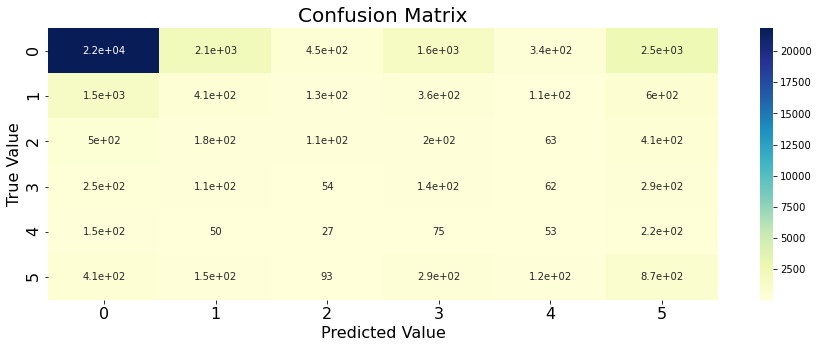

In [42]:
validate_result(y_val,clf.predict(val_data),clf.predict_proba(val_data),model="SGDClassifier with logistic regression")

#### SVM with SGDClassifier 

In [43]:
param = {'alpha': [1e-4, 1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2, 1e3],'penalty': ['l2','l1']}

svm_rand = RandomizedSearchCV(SGDClassifier(loss='hinge',early_stopping=True,n_iter_no_change=50),param,
                              verbose=50,return_train_score=True,scoring='f1_macro',cv=5,n_jobs=3)
svm_rand.fit(train_data,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5,
                   estimator=SGDClassifier(early_stopping=True,
                                           n_iter_no_change=50),
                   n_jobs=3,
                   param_distributions={'alpha': [0.0001, 0.001, 0.01, 0.1, 1.0,
                                                  10.0, 100.0, 1000.0],
                                        'penalty': ['l2', 'l1']},
                   return_train_score=True, scoring='f1_macro', verbose=50)

In [48]:
svm_rand.best_score_

0.2288334368310621

In [49]:
svm_rand.best_estimator_

SGDClassifier(alpha=0.001, early_stopping=True, n_iter_no_change=50)

In [50]:
clf = SGDClassifier(early_stopping=True, n_iter_no_change=50)
clf.fit(train_data,y_train)

SGDClassifier(early_stopping=True, n_iter_no_change=50)

In [51]:
#validate_result(y_val,clf.predict(val_data),clf.predict_proba(val_data),model="KNN with N=3")
validate_result(y_val,clf.predict(X_cv),model = "SVM with SGD")

NameError: name 'X_cv' is not defined

#### Random Forest

In [110]:
params = {"max_depth": [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14],
          "min_samples_leaf": [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
rf_rand = RandomizedSearchCV(RandomForestClassifier(),params,
                              verbose=8,return_train_score=True,scoring='f1_weighted',cv=5,n_jobs=5)
rf_rand.fit(train_data,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=5,
                   param_distributions={'max_depth': [2, 3, 4, 5, 6, 7, 8, 9,
                                                      10, 11, 12, 13, 14],
                                        'min_samples_leaf': [3, 4, 5, 6, 7, 8,
                                                             9, 10, 11, 12, 13,
                                                             14]},
                   return_train_score=True, scoring='f1_weighted', verbose=8)

In [111]:
rf_rand.best_score_

0.4276370811767003

In [112]:
rf_rand.best_estimator_

RandomForestClassifier(max_depth=13, min_samples_leaf=8)

In [114]:
clf = RandomForestClassifier(max_depth=13, min_samples_leaf=8,n_jobs=5)
clf.fit(train_data,y_train)

RandomForestClassifier(max_depth=13, min_samples_leaf=8, n_jobs=5)

The Result for the Random Forest Classification is a Below

Recall Score: 44.544 %
Precision Score: 50.159 %
F1 Score:  0.431
Log Loss:  1.55
Classification Report:
               precision  recall  f1-score    support
1.0               0.437   0.710     0.541  14499.000
2.0               0.581   0.221     0.321  14223.000
3.0               0.524   0.294     0.376  14370.000
4.0               0.561   0.326     0.413  14440.000
6.0               0.574   0.408     0.477  14516.000
7.0               0.332   0.710     0.453  14381.000
accuracy          0.445   0.445     0.445      0.445
macro avg         0.502   0.445     0.430  86429.000
weighted avg      0.502   0.445     0.431  86429.000


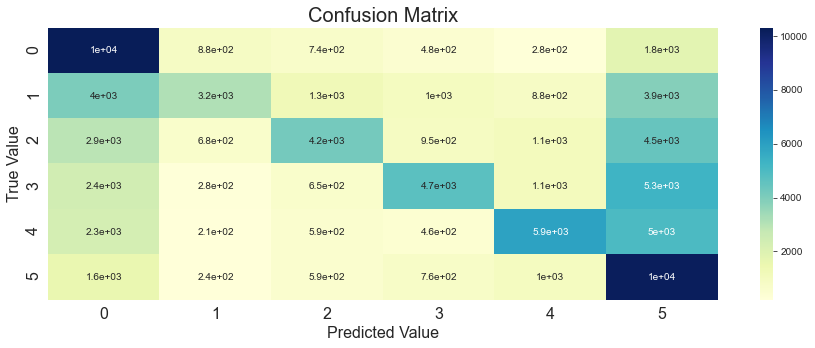

In [116]:
validate_result(y_val,clf.predict(val_data),clf.predict_proba(val_data),model="Random Forest")